# Admissions analysis and prediction

# Context:

Jamboree is the oldest institute in India and the best of its kind, which offers comprehensive classroom preparation programs for tests such as GMAT®, GRE®, SAT®, TOEFL™ and IELTS™. It has helped thousands of students like you make it to top colleges abroad. Be it GMAT, GRE or SAT, their unique problem-solving methods ensure maximum scores with minimum effort.
They recently launched a feature where students/learners can come to their website and check their probability of getting into the IVY league college. This feature estimates the chances of graduate admission from an Indian perspective.

# Column Profile

Serial No. (Unique row ID)

GRE Scores (out of 340)

TOEFL Scores (out of 120)

University Rating (out of 5)

Statement of Purpose and Letter of Recommendation Strength (out of 5)

Undergraduate GPA (out of 10)

Research Experience (either 0 or 1)

Chance of Admit (ranging from 0 to 1)

# Problem Statement

Analyse to help Jamboree understand:

**1. What factors are important in graduate admissions?**
* This alllows us to identify the most important features/attributes that are contributing to the admissions.
* The client can design their curriculum to focus on the areas that are relevant to the most important factors.
* This may allow the client to understand what leads to successful adimissions and can help them measure their success and continuosly improve their services.
      
**2. How these factors are interrelated among themselves?**
   * Insights into Relationships: Exploring the interrelationships between the variables can provide valuable insights. For example, if scores of two exams are highly correlated, it might suggest that students who do well in one exam tend to do well in the other also (for eg: GRE and TOEFL scores).
   * Multicollinearity: If two or more variables are highly correlated, they may carry similar information (However, correlation does not imply causation). This impacts certain models negatively and certain models positively. 
        - For tree-based models like Decision Tree model, having features that have high correlation between themselves and high correlation with the target variable can improve the performance of the model as they can help in capturing more complex relationships.
        - For models like linear regression, having correlated features, make it difficult to determine which feature is contributing to the prediction. This can lead to unstable estimates and large standard errors.
   * Feature Selection: Understanding the relationship between variables can help is selecting the most relevant features for the machine learning models. This can simplify the model, reduce overfitting and improve the performance.
   * Creating new features: If two features are highly correlated, we can create a new feature out of this that captures the important aspects of the data. For example, if SOP and LOR are highly correlated, we may create a new feature that represents the overall quality of the application. If more than two variables are highly correlated, we can use Principal Component Analysis technique to with these highly correlated variables to reduce them to a single feature.
        
**3. Predict student's chances of admission into IVY league colleges, given the rest of the variables.**
   * By predicting a student's chance of admission, the client can provide personalized recommendations to students in specific areas where they can improve incase they have a low chance of admission.

In [1]:
#!pip install statsmodels

# Importing Libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, f_oneway, ttest_ind, spearmanr, kendalltau, chi2_contingency
import statsmodels.api as sm
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression,Lasso, Ridge
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy import stats

from sklearn.pipeline import make_pipeline


In [3]:
import warnings
# Settings the warnings to be ignored 
warnings.filterwarnings('ignore') 

Loading the dataset

In [4]:
data = pd.read_csv("C:\\Users\\moncy\\Documents\\Scaler DSML MSc\\Projects\\Jamboree Education - Linear Regression\\Jamboree_Admission.csv")
data.head()

,Serial No.,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,1,337,118,4,4.5,4.5,9.65,1,0.92
1,2,324,107,4,4.0,4.5,8.87,1,0.76
2,3,316,104,3,3.0,3.5,8.00,1,0.72
3,4,322,110,3,3.5,2.5,8.67,1,0.80
4,5,314,103,2,2.0,3.0,8.21,0,0.65


● **Serial No.:** This column represents the unique row identifier for each applicant in the
dataset.

● **GRE Scores:** This column contains the GRE (Graduate Record Examination) scores of
the applicants, which are measured on a scale of 0 to 340.

● **TOEFL Scores:** This column includes the TOEFL (Test of English as a Foreign Language)
scores of the applicants, which are measured on a scale of 0 to 120.

● **University Rating:** This column indicates the rating or reputation of the university that
the applicants are associated with.
    
    ○ The rating is based on a scale of 0 to 5, with 5 representing the highest rating.

● **SOP:** This column represents the strength of the applicant's statement of purpose,
rated on a scale of 0 to 5, with 5 indicating a strong and compelling SOP.

● **LOR:** This column represents the strength of the applicant's letter of recommendation,
rated on a scale of 0 to 5, with 5 indicating a strong and compelling LOR.

● **CGPA:** This column contains the undergraduate Grade Point Average (GPA) of the
applicants, which is measured on a scale of 0 to 10.

● **Research:** This column indicates whether the applicant has research experience (1) or
not (0).

● **Chance of Admit:** This column represents the estimated probability or chance of
admission for each applicant, ranging from 0 to 1.
These columns provide relevant information about the applicants' academic qualifications, test
scores, university ratings, and other factors that may influence their chances of admission.

In [5]:
data.columns

Index(['Serial No.', 'GRE Score', 'TOEFL Score', 'University Rating', 'SOP',
       'LOR ', 'CGPA', 'Research', 'Chance of Admit '],
      dtype='object')

In [6]:
data.rename(columns = {'LOR ': 'LOR', 
                       'Serial No.' :'Serial No',
                      'Chance of Admit ':'Chance of Admit'}, inplace = True)

In [7]:
data.columns

Index(['Serial No', 'GRE Score', 'TOEFL Score', 'University Rating', 'SOP',
       'LOR', 'CGPA', 'Research', 'Chance of Admit'],
      dtype='object')

In [8]:
data.shape

(500, 9)

Observations:
1. There are 500 records and 9 features in the dataset.

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Serial No          500 non-null    int64  
 1   GRE Score          500 non-null    int64  
 2   TOEFL Score        500 non-null    int64  
 3   University Rating  500 non-null    int64  
 4   SOP                500 non-null    float64
 5   LOR                500 non-null    float64
 6   CGPA               500 non-null    float64
 7   Research           500 non-null    int64  
 8   Chance of Admit    500 non-null    float64
dtypes: float64(4), int64(5)
memory usage: 35.3 KB


Observations:
1. There are no missing data in the dataset.
2. All the features are numerical variables.
3. There are 5 integer variables and 4 float variables.

### Descriptive Statistics

In [10]:
data.describe()

,Serial No,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
count,500.000000,500.000000,500.000000,500.000000,500.000000,500.00000,500.000000,500.000000,500.00000
mean,250.500000,316.472000,107.192000,3.114000,3.374000,3.48400,8.576440,0.560000,0.72174
std,144.481833,11.295148,6.081868,1.143512,0.991004,0.92545,0.604813,0.496884,0.14114
min,1.000000,290.000000,92.000000,1.000000,1.000000,1.00000,6.800000,0.000000,0.34000
25%,125.750000,308.000000,103.000000,2.000000,2.500000,3.00000,8.127500,0.000000,0.63000
50%,250.500000,317.000000,107.000000,3.000000,3.500000,3.50000,8.560000,1.000000,0.72000
75%,375.250000,325.000000,112.000000,4.000000,4.000000,4.00000,9.040000,1.000000,0.82000
max,500.000000,340.000000,120.000000,5.000000,5.000000,5.00000,9.920000,1.000000,0.97000


Observations:
1. The Serial No starts from 1 and ends at 500. These are unique values for each record.
2. GRE Score in the dataset ranges from 290 to 340. 25% of the students/learners in the dataset have scored 308 or below. At least 25% of the students/learners in the dataset have scored 325 or more. At least 1 student/learner has scored 340.
3. The mean GRE score and the median GRE score are 316.472 and 317 respectively. Since the mean and median are very close to each other, the GRE variable could be having a normal distribution with a standard deviation of 11.295.
4. TOEFL Score in the dataset ranges from 92 to 120. 25% of the students/learners in the dataset have scored 103 or below. At least 25% of the students/learners in the dataset have scored 112 or more. At least 1 student/learner has scored 120.
5. The mean TOEFL score and the median GRE score are 107.192 and 107 respectively. Since the mean and median are very close to each other, the TOEFL variable could be having a normal distribution with a standard deviation of 6.087868.
6. The University Rating is a discrete variable. In the dataset, it ranges from 1 to 5. 50% of the students/learners in the dataset are associated with universities that have rating less than or equal to 3. At least 25% of the students/learners in the dataset are associated with universities that have rating greater than or equal to 4. At least 1 student/learner is associated with university that have rating as 5.
7. The SOP is a discrete variable. In the dataset, it ranges from 1 to 5. 50% of the students'/learners' SOP is rated 3.5 or less in the dataset. At least 25% of the students'/learners' SOP is rated 4 or above and at least one student/learner has 5 rating for their SOP in the dataset.
8. The LOR is a discrete variable. In the dataset, it ranges from 1 to 5. 50% of the students'/learners' LOR is rated 3.5 or less in the dataset. At least 25% of the students'/learners' LOR is rated 4 or above and at least one student/learner has 5 rating for their LOR in the dataset. At least 75% of the students/learners have LOR rating greater than or equal to 3.
9. The CGPA is a discrete variable. In the dataset, it ranges from 6.8 to 9.92. 50% of the students have CGPA greater than or equal to 8.56. At least 25% of the students have CGPA score of 9.04 or more. At least one student has scored 9.92.
10. The Research is a discrete variable with 0 or 1 as valid values. At least 50% of the students/learners have research experience.
11. Chance of Admit is a continuous variable with values ranging from 0.34 to 0.97. At least 50% of the students/learners have admission chance of 0.72 or more. 75% of the students have more than or equal to 0.63 chance of admission in the dataset. This could be an imbalanced dataset if we approach it as a classification problem.

### Univariate Analysis

In [11]:
#checking the unique values in the variables.
for col in data.columns:
    print(f"There are {data[col].nunique()} unique values in {col}.")

There are 500 unique values in Serial No.
There are 49 unique values in GRE Score.
There are 29 unique values in TOEFL Score.
There are 5 unique values in University Rating.
There are 9 unique values in SOP.
There are 9 unique values in LOR.
There are 184 unique values in CGPA.
There are 2 unique values in Research.
There are 61 unique values in Chance of Admit.


Observations:
1. The University Rating, SOP, LOR and Research variables have less than 10 unique values.
2. The University Rating, SOP and LOR variables are ordinal and Research is a binary variable.

In [12]:
print(f"The unique values for University Rating in the dataset are : {data['University Rating'].unique()}")

The unique values for University Rating in the dataset are : [4 3 2 5 1]


In [13]:
print(f"The unique values for SOP in the dataset are : {data['SOP'].unique()}")

The unique values for SOP in the dataset are : [4.5 4.  3.  3.5 2.  5.  1.5 1.  2.5]


In [14]:
print(f"The unique values for LOR in the dataset are : {data['LOR'].unique()}")

The unique values for LOR in the dataset are : [4.5 3.5 2.5 3.  4.  1.5 2.  5.  1. ]


In [15]:
print(f"The unique values for Research in the dataset are : {data['Research'].unique()}")

The unique values for Research in the dataset are : [1 0]


In [16]:
def univariate_plotting(data, col, bins = 'auto', plot = 'distribution'):
    """
    This function helps in creating univariate plots (countplot, histplot and boxplot) for a single feature in a dataframe.
    It uses the searborn library to create plots.
    
    Input parameters:
        data: pandas dataframe
        col: pandas dataframe column
        bins: number of bins in the histplot.
              default value is 'auto'
        plot: 'distribution'(default) or 'box'
    """
    if plot == 'distribution':
        if data[col].nunique() < 10:
            #create a countplot
            sns.countplot(data = data, x = col)
            #show value counts for unique values in the feature
            print(data[col].value_counts())
        else:
            #create a histogram plot
            sns.histplot(data = data, x = col, kde = True, bins = bins)
    elif plot == 'box':
        #create a boxplot
        sns.boxplot(data = data, x = col)
        
        #finding outliers using IQR method
        Q1 = np.percentile(data[col], 25)
        Q3 = np.percentile(data[col], 75)
        iqr = Q3 - Q1
        lower_bound = Q1 - (iqr * 1.5)
        upper_bound = Q3 + (iqr * 1.5)
        print(f"Quartile 1: {Q1}")
        print(f"Quartile 3: {Q3}")
        print(f"Median: {np.percentile(data[col], 50)}")
        print(f"Mean: {np.mean(data[col])}")
        print(f"The IQR is {iqr}.")
        
        #extracting outliers if present
        df = data[(data[col] < lower_bound) & (data[col]>upper_bound)]
        print(f"Lower Bound: {lower_bound}")
        print(f"Upper Bound: {upper_bound}")
        print(f"The min value is {np.min(data[col])}")
        print(f"The max value is {np.max(data[col])}")
        print(f"Approximate number of outliers in the {col} variable is {df.shape[0]}")
    plt.show()

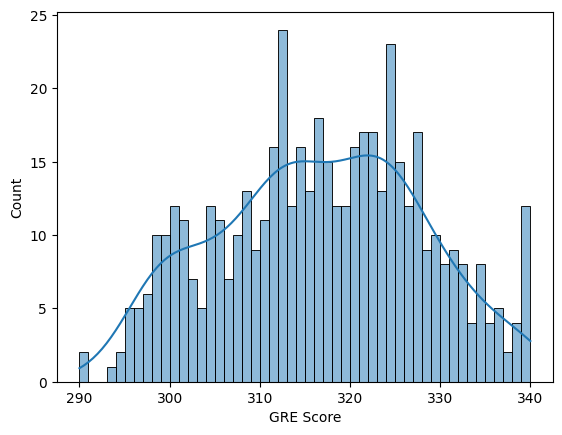

In [17]:
univariate_plotting(data, 'GRE Score', 50)

Observations:
1. There are noticeable peak around the GRE score approximately close to 320.
2. The distributions appears to be more like a normal distribution, indicating that very high and very low scores are less common.

Quartile 1: 308.0
Quartile 3: 325.0
Median: 317.0
Mean: 316.472
The IQR is 17.0.
Lower Bound: 282.5
Upper Bound: 350.5
The min value is 290
The max value is 340
Approximate number of outliers in the GRE Score variable is 0


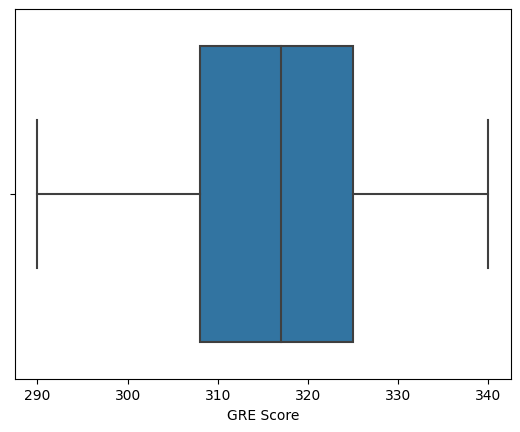

In [18]:
univariate_plotting(data = data, col = 'GRE Score', plot = 'box')

Observations:
1. There are no outliers in the GRE Score.
2. The mean and the median are 316.472 and 317 respectively indicating a near normal distribution.
3. The data is concentrated in the IQR of 17, between the GRE scores 308 and 325.

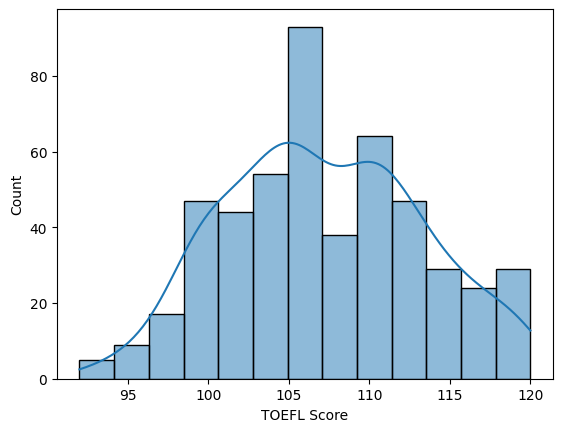

In [19]:
univariate_plotting(data, 'TOEFL Score')

Observations:
1. There are noticeable peak around the TOEFL score approximately close to 105.
2. The distributions appears to be more like a normal distribution, indicating that very high and very low scores are less common.

Quartile 1: 103.0
Quartile 3: 112.0
Median: 107.0
Mean: 107.192
The IQR is 9.0.
Lower Bound: 89.5
Upper Bound: 125.5
The min value is 92
The max value is 120
Approximate number of outliers in the TOEFL Score variable is 0


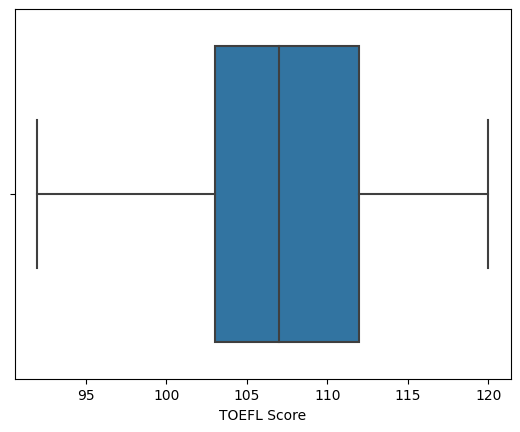

In [20]:
univariate_plotting(data, 'TOEFL Score', plot = 'box')

Observations:
1. There are no outliers in the TOEFL Score.
2. The mean and the median are 107.192 and 107 respectively indicating a near normal distribution.
3. The data is concentrated in the IQR of 9, between the TOEFL scores 103 and 112.

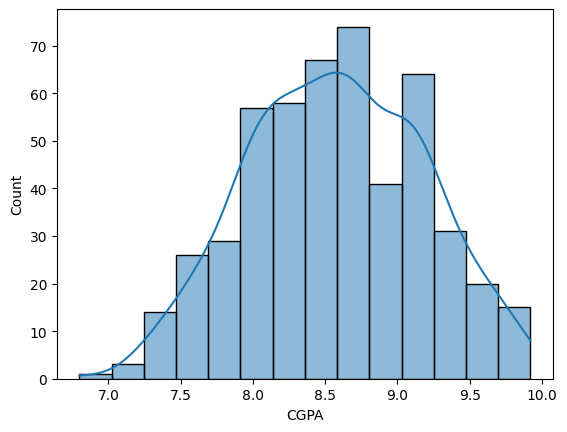

In [21]:
univariate_plotting(data, 'CGPA')

Observations:
1. There are noticeable peak around the CGPA approximately close to 8.5.
2. The distributions appears to be more like a normal distribution, indicating that very high and very low scores are less common.

Quartile 1: 8.127500000000001
Quartile 3: 9.04
Median: 8.56
Mean: 8.576439999999998
The IQR is 0.9124999999999979.
Lower Bound: 6.7587500000000045
Upper Bound: 10.408749999999996
The min value is 6.8
The max value is 9.92
Approximate number of outliers in the CGPA variable is 0


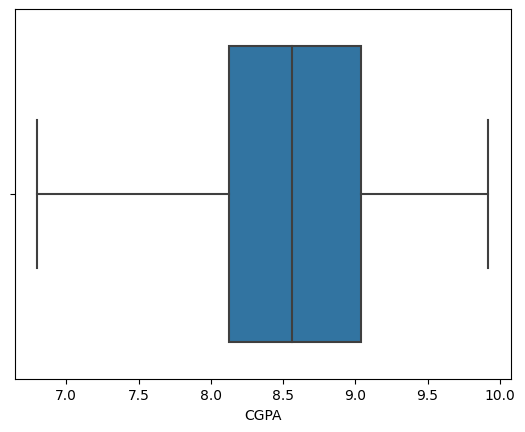

In [22]:
univariate_plotting(data, 'CGPA', plot = 'box')

Observations:
1. There are no outliers in the CGPA.
2. The mean and the median are 8.576 and 8.56 respectively indicating a near normal distribution.
3. The data is concentrated in the IQR of 0.91, between the CGPA 8.1275 and 9.04.

University Rating
3    162
2    126
4    105
5     73
1     34
Name: count, dtype: int64


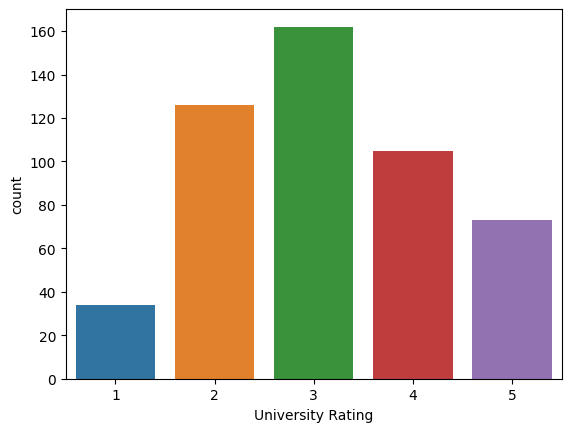

In [23]:
univariate_plotting(data, 'University Rating')

Observations:
1. The Top two University Rating are 3 being the top rating followed by 2. The least University Rating is 1.
2. This suggests that most universities are rated moderately and few are rated low.
3. The distribution shows that there is good variability in the University Rating variable.

SOP
4.0    89
3.5    88
3.0    80
2.5    64
4.5    63
2.0    43
5.0    42
1.5    25
1.0     6
Name: count, dtype: int64


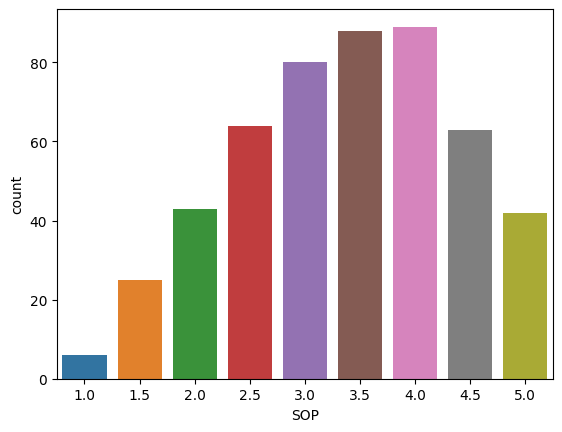

In [24]:
univariate_plotting(data, 'SOP')

Observations:
1. The top three ratings of SOP are 4 being the most common rating, followed by 3.5 and 3.
2. Very few SOPs are rated as 1.
3. This suggests that most of the SOPs of the students are moderately rated between 3, 3.5 and 4.
4. Very few SOPs are rated the lowest rating.

LOR
3.0    99
4.0    94
3.5    86
4.5    63
2.5    50
5.0    50
2.0    46
1.5    11
1.0     1
Name: count, dtype: int64


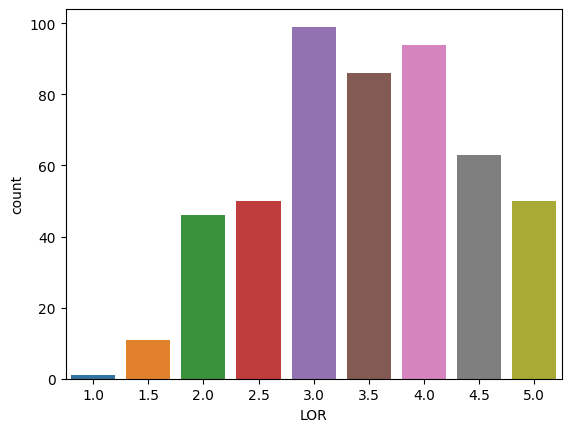

In [25]:
univariate_plotting(data, 'LOR')

Observations:
1. The top three ratings for LOR are 3 being the most common rating, followed by 4 and 3.5.
2. Only 1 TOR is rated as 1.
3. This suggests that most of the LORs of the students are moderately rated between 3, 3.5 and 4.
4. Very few LORs are rated the lowest rating.

Research
1    280
0    220
Name: count, dtype: int64


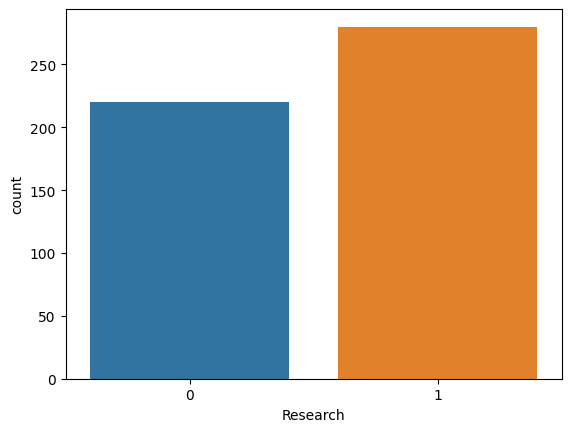

In [26]:
univariate_plotting(data, 'Research')

Observations:
1. There are more students/learners that have research experience that those who don't. 
2. About 280 students out of 500 have reasearch experience and 220 out of 500 don't have reasearch experience.

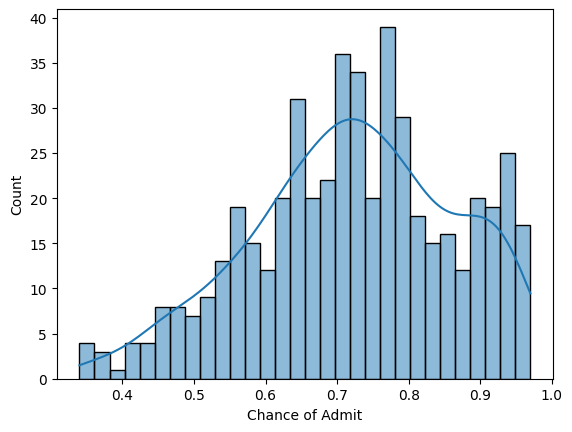

In [27]:
univariate_plotting(data, 'Chance of Admit', 30)

Observations:
1. There are noticeable peak around the Chance of Admit approximately close to 0.7.
2. The distributions appears to be more like a normal distribution, indicating that very low chances of admission is less common. The distribution is slight positive skewed indicating slightly more number of students have high chances of admission than the number of students that have lowest chances of admission.

Quartile 1: 0.63
Quartile 3: 0.82
Median: 0.72
Mean: 0.72174
The IQR is 0.18999999999999995.
Lower Bound: 0.3450000000000001
Upper Bound: 1.105
The min value is 0.34
The max value is 0.97
Approximate number of outliers in the Chance of Admit variable is 0


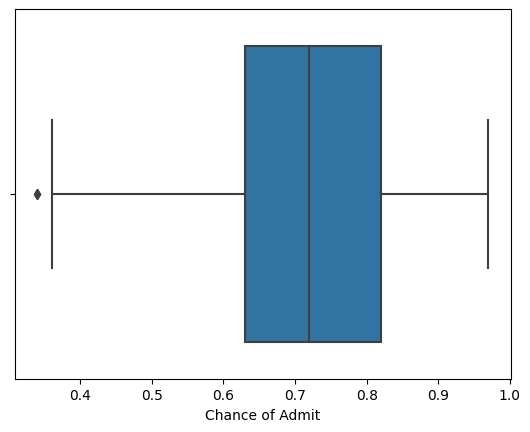

In [28]:
univariate_plotting(data, 'Chance of Admit', plot = 'box')

Observations:
1. There are no outliers in the Chance of Admit.
2. The mean and the median are 0.72174 and 0.72 respectively indicating a near normal distribution.
3. The data is concentrated in the IQR of 0.189, between the Chance of Admit 0.63 and 0.82.

##### Checking for outliers

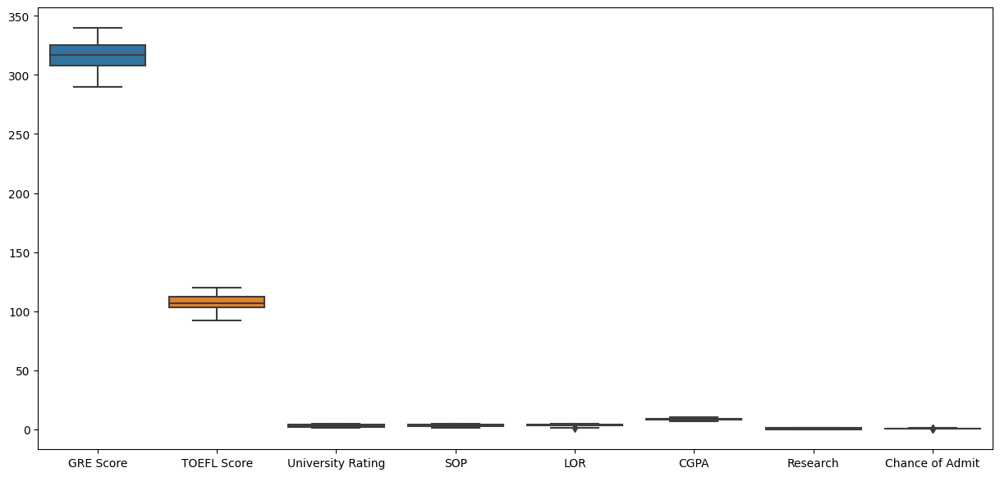

In [29]:
plt.figure(figsize = (15,7))
sns.boxplot(data.drop(['Serial No'], axis = 1))
plt.show()

Observations:
1. The box plots comparing all the variables show that the GRE Score and the TOEFL Score variables are on a different scale than the University Rating, SOP, LOR, CGPA, Research and Chance of Admit variables.
2. We will need to perform scaling or normalization to bring all the variables in the same scale.
3. There are no outliers in any of the features.

### Multivariate Analysis

In [30]:
def corr_hypo_test(data, var1, var2, alpha = 0.05, test = 'pearson'):
    """
    This function uses the scipy library to do hypothesis testing using correlations.
    It can perform pearson, spearman and kendalltau correlation tests.
    
    Input:
        data: pandas dataframe
        var1: variable 1
        var2: variable 2
        alpha: Significance level. default is 0.05
        test: Name of the correlation test to perform.
              values are 'pearson'(default), spearman, kendall 
    """
    #defining Null and alternate hypothesis.
    H0 = f"There is no correlation between the {var1} and the {var2}."
    Ha = f"There is a correlation between the {var1} and the {var2}."
    
    if test == 'pearson':
        #performing pearson correlation test
        coef, p_value = pearsonr(data[var1], data[var2])
    elif test == 'spearman':
        #performing spearman correlation test
        coef, p_value = spearmanr(data[var1], data[var2])
    elif test == 'kendall':
        #performing kendalltau correlation test
        coef, p_value = kendalltau(data[var1], data[var2])
    print(f"The correlation coefficient is {coef} and p value is {p_value}.")
    
    # checking the p value against the significance level
    if p_value < alpha:
        print("Rejected Null Hypothesis.")
        print(f"Result: {Ha}")
    else:
        print("Failed to reject the Null Hypothesis.")
        print(f"Result: {H0}")

In [31]:
def test_anova(data, cat_feat, num_feat, alpha = 0.05):
    """
    This function uses the scipy library to perform the oneway ANOVA test.
    
    Input:
        data: pandas dataframe
        cat_feat: categorical variable to be used
        num_feat: numerical variable to be used
        alpha: significance level. default is 0.05
    """
    #defining the null and alternate hypothesis
    H0 = "The means are same"
    Ha = "The means are different"
    variables = []
    
    #getting the group samples for the categorical variable from the numerical variable
    for i in data[cat_feat].unique():
        variables.append(data.loc[data[cat_feat] == i, num_feat])
    
    #performing oneway ANOVA test
    _, p_value = f_oneway(*variables)
    alpha = 0.05
    
    #checking the p value against the significance level
    if p_value < alpha:
        print(f"P value: {p_value}. Rejected Null Hypothesis.")
        print(Ha)
    else:
        print(f"P value: {p_value}. Falied to reject Null Hypothesis.")
        print(H0)

In [32]:
def multi_cat_ttest_hypo_test(data, cat_feat, num_feat, alpha = 0.05, alternative = 'less'):
    """
    This function uses the scipy library to perform the t-test of independence,
    if there are 2 or more than 2 unique variables in the cat_feat.
    Input:
        data: pandas dataframe
        cat_feat: categorical variable to use.
        num_feat: numerical variable to use.
        alpha: significance level. default is 0.05
        alternative: default valut is 'less'. same as the 'alternative' parameter in scipy's ttest_ind() function.
    """
    #Running the test for each unique value
    for i in data[cat_feat].unique():
        #defining the null and alternate hypothesis
        H0 = f"The average {num_feat} for students with {cat_feat} {i} is not {alternative} than the average {num_feat} for students with {cat_feat} {i+1}"
        Ha = f"The average {num_feat} for students with {cat_feat} {i} is {alternative} than the average {num_feat} for students with {cat_feat} {i+1}"
        
        #extracting the variable 1 and 2
        var1 = data.loc[data[cat_feat] == i, num_feat]
        var2 = data.loc[data[cat_feat] == i+1, num_feat]
        try:
            #performing ttest_ind on the extracted variables
            _, p_value = ttest_ind(var1, var2, alternative = alternative)
            if p_value < alpha:
                print(f"p value: {p_value}. Rejected Null Hypothesis.")
                print(f"Result: {Ha}")
        except:
            pass

In [33]:
def check_association(data, var1, var2, alpha = 0.05):
    """
    This function uses the scipy library to perform the chi square test. The function uses the chi_contingency test.
    Input:
        data: pandas dataframe
        var1: categorical variable 1
        var2: categorical variable 2
        alpha: significance level. default = 0.05
    """
    #defining the null and alternate hypothesis
    H0 = "The two variables are independent. There is no significant association between the two variables."
    Ha = "There is significant association between the two variables."
    
    #performing the chi2_contingency test
    chi2, p_value, dof, expected = chi2_contingency(pd.crosstab(data[var1], data[var2]))
    print(p_value)
    if p_value < alpha:
        print("Rejected Null Hypothesis.")
        print(Ha)
    else:
        print("Failed to reject Null Hypothesis.")
        print(H0)

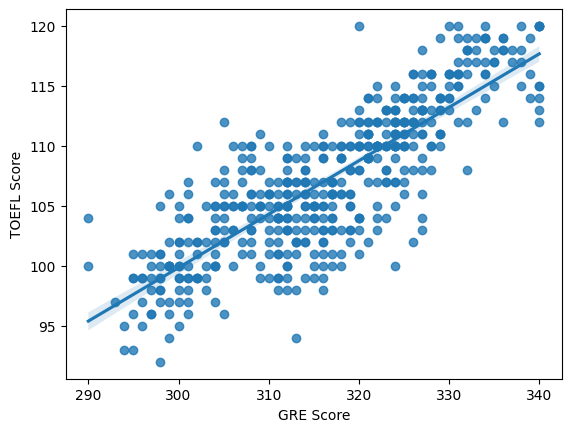

In [34]:
sns.regplot(data = data, x = 'GRE Score', y = 'TOEFL Score')
plt.show()

Observations:
1. The regression plot shows a clear positive correlation between the GRE Score and TOEFL Score.
2. This might imply that students/learners that do well in one test, tend to do well in the other test also.

In [35]:
# Testing the above hypothesis about GRE Score and TOEFL Score
corr_hypo_test(data, 'GRE Score', 'TOEFL Score')

The correlation coefficient is 0.827200403531721 and p value is 9.28954529603121e-127.
Rejected Null Hypothesis.
Result: There is a correlation between the GRE Score and the TOEFL Score.


Observations:
1. The hypothesis test result shows that there is a high positive correlation between the GRE Score and TOEFL Score with correlation coefficient of approximately 0.83. This is indicating that students/learners who did well in one exam, tend to do well in the other also.

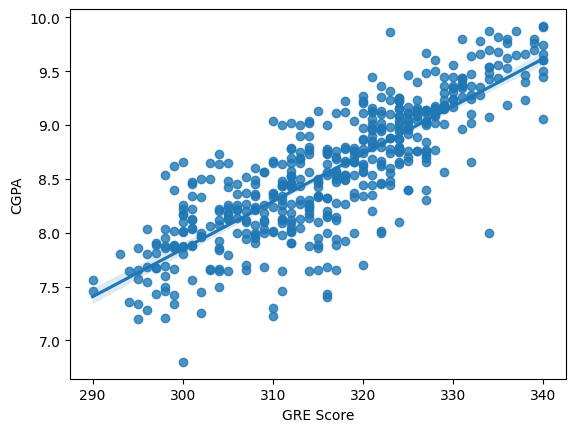

In [36]:
sns.regplot(data = data, x = 'GRE Score', y = 'CGPA')
plt.show()

Observations:
1. The regression plot shows a high positive correlation between the GRE Score and CGPA variables.
2. This indicates that the students that have good CGPA, tend to do well in GRE exams.

In [37]:
# Testing the above hypothesis between GRE Score and CGPA variables.
corr_hypo_test(data, 'GRE Score', 'CGPA')

The correlation coefficient is 0.8258779536403558 and p value is 5.18607627391576e-126.
Rejected Null Hypothesis.
Result: There is a correlation between the GRE Score and the CGPA.


Observation:
1. The hypothesis test result shows that there is a high positive correlation between the GRE Score and CGPA, with a correlation coefficient of 0.83. This indicates that, students who have high CGPA, tend to do well in GRE exams.

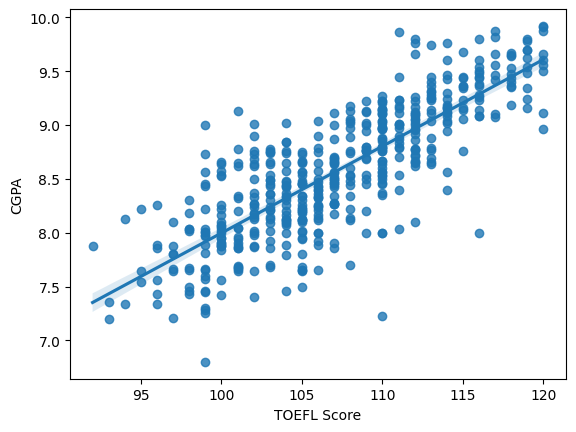

In [38]:
sns.regplot(data = data, x = 'TOEFL Score', y = 'CGPA')
plt.show()

Observations:
1. The regression plot shows a positive correlation between the CGPA and the TOEFL scores.
2. This indicates that, students that have high CGPA, test to do well in TOEFL scores.

In [39]:
#Testing the above hypothesis between CGPA and TOEFL Score.
corr_hypo_test(data, 'CGPA','TOEFL Score')

The correlation coefficient is 0.8105735363036225 and p value is 8.371647139353116e-118.
Rejected Null Hypothesis.
Result: There is a correlation between the CGPA and the TOEFL Score.


Observations:
1. The hypothesis test result shows that there is a high positive correlation between the TOEFL Score and CGPA, with a correlation coefficient of 0.81. This indicates that, students who have high CGPA, tend to do well in TOEFL exams.

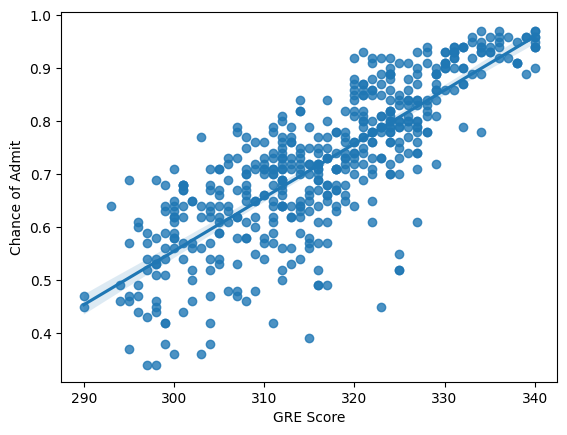

In [40]:
sns.regplot(data = data, x = 'GRE Score', y = 'Chance of Admit')
plt.show()

Observations:
1. The regression plot shows a high positive correlation between the GRE Score and Chance of Admit variables.
2. This indicates that students who have high GRE score might have high chance of admission.

In [41]:
#Testing the above hypothesis between GRE Score and Chance of Admit
corr_hypo_test(data, 'GRE Score', 'Chance of Admit')

The correlation coefficient is 0.81035063546326 and p value is 1.0884036862479093e-117.
Rejected Null Hypothesis.
Result: There is a correlation between the GRE Score and the Chance of Admit.


Observations:
1. The hypothesis test result shows that there is a high positive correlation between the GRE Score and Chance of Admit, with a correlation coefficient of 0.81. This indicates that, students who have high GRE Score, tend to have high chance of admission.

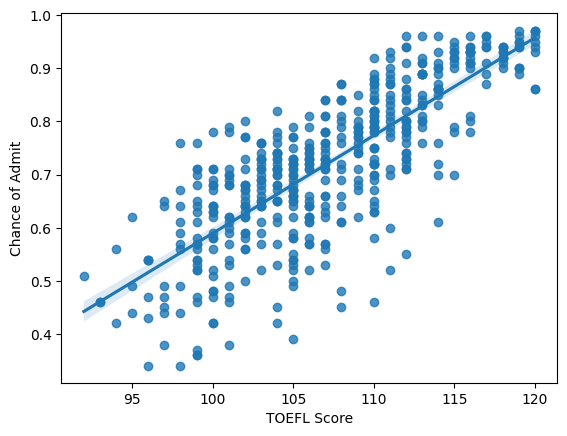

In [42]:
sns.regplot(data = data, x = 'TOEFL Score', y = 'Chance of Admit')
plt.show()

Observations:
1. The regression plot shows a high positive correlation between the TOEFL Score and Chance of Admit variables.
2. This indicates that students who have high TOEFL score might have high chance of addmission.

In [43]:
# Testing the above hypothesis between TOEFL Score and Chance of Admit.
corr_hypo_test(data, 'TOEFL Score','Chance of Admit')

The correlation coefficient is 0.792227614305083 and p value is 6.729926762330081e-109.
Rejected Null Hypothesis.
Result: There is a correlation between the TOEFL Score and the Chance of Admit.


Observations:
1. The hypothesis test result shows that there is a positive correlation between the TOEFL Score and Chance of Admit, with a correlation coefficient of 0.79. This indicates that, students who have high TOEFL Score, tend to have high chance of admission.

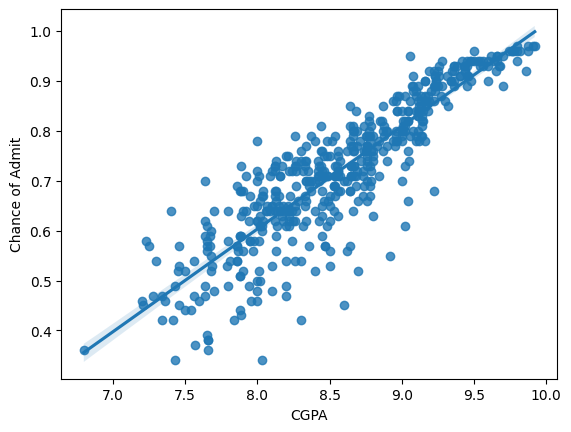

In [44]:
sns.regplot(data = data, x = 'CGPA', y = 'Chance of Admit')
plt.show()

Observations:
1. The regression plot shows a high positive correlation between the CGPA and Chance of Admit variables.
2. This indicates that students who have high CGPA might have high chance of addmission.

In [45]:
# Testing the above hypothesis between the CGPA and Chance of Admit
corr_hypo_test(data, 'CGPA', 'Chance of Admit')

The correlation coefficient is 0.8824125749045744 and p value is 3.3965448587112306e-165.
Rejected Null Hypothesis.
Result: There is a correlation between the CGPA and the Chance of Admit.


Observations:
1. The hypothesis test result shows that there is a high positive correlation between the CGPA and Chance of Admit, with a correlation coefficient of 0.88. This indicates that, students who have high CGPA, tend to have high chance of admission.

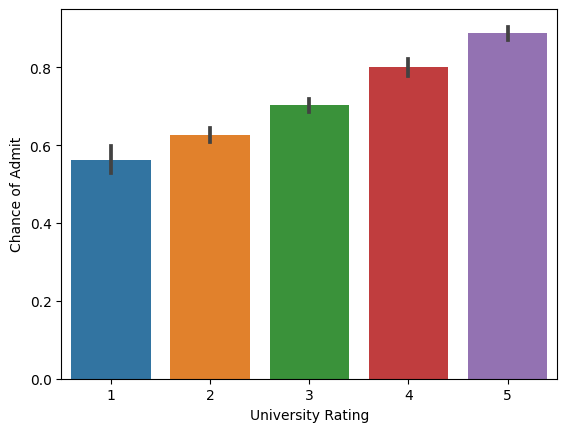

In [46]:
sns.barplot(data = data, x = 'University Rating', y = 'Chance of Admit')
plt.show()

Observations:
1. The bar chart shows the higher the students' university rank, the higher their average chance of admission.

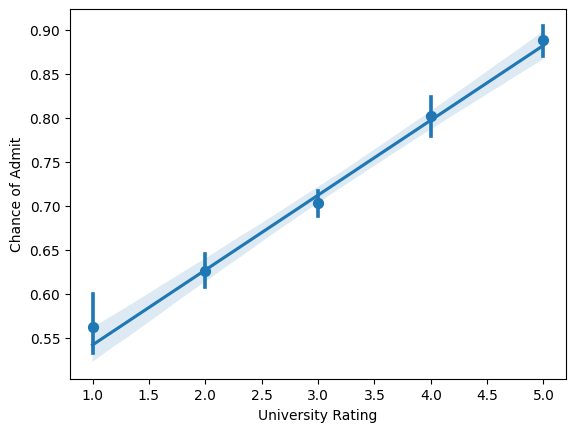

In [47]:
sns.regplot(data = data, y = 'Chance of Admit', x = 'University Rating', x_estimator = np.mean)
plt.show()

Observations:
1. The regression plot shows an increasing trend line in the average chance of admit as the University Rating increases.

In [48]:
#Testing the hypothesis if the average chance of Admit is significantly different for each University Ratings
test_anova(data,'University Rating', 'Chance of Admit')

P value: 7.753395328023127e-69. Rejected Null Hypothesis.
The means are different


Observations:
1. There is significant difference in the average 'Chance of Admit' for each University Rating.

In [49]:
# Testing the hypothesis that As the University Rating increases, the average Chance of Admit also increases.
multi_cat_ttest_hypo_test(data, 'University Rating','Chance of Admit')

p value: 4.960189067059762e-08. Rejected Null Hypothesis.
Result: The average Chance of Admit for students with University Rating 4 is less than the average Chance of Admit for students with University Rating 5
p value: 8.156417731879028e-13. Rejected Null Hypothesis.
Result: The average Chance of Admit for students with University Rating 3 is less than the average Chance of Admit for students with University Rating 4
p value: 5.683327614767875e-10. Rejected Null Hypothesis.
Result: The average Chance of Admit for students with University Rating 2 is less than the average Chance of Admit for students with University Rating 3
p value: 0.0010678539868263347. Rejected Null Hypothesis.
Result: The average Chance of Admit for students with University Rating 1 is less than the average Chance of Admit for students with University Rating 2


Observations:
1. There is significant evidence that the average chance of admission increases as the University Rating increase.

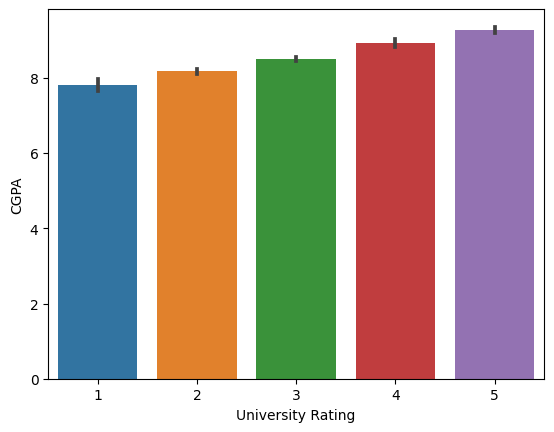

In [50]:
sns.barplot(data = data, x = 'University Rating', y = 'CGPA')
plt.show()

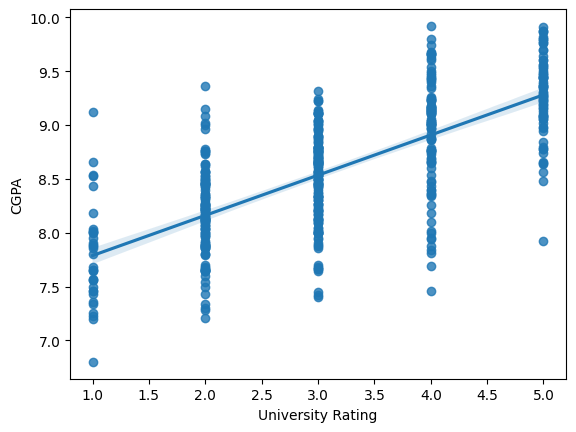

In [51]:
sns.regplot(data = data, x = 'University Rating', y = 'CGPA')
plt.show()

In [52]:
test_anova(data, 'University Rating', 'CGPA')

P value: 6.002370579123604e-73. Rejected Null Hypothesis.
The means are different


In [53]:
multi_cat_ttest_hypo_test(data, 'University Rating','CGPA')

p value: 1.3441675732139567e-06. Rejected Null Hypothesis.
Result: The average CGPA for students with University Rating 4 is less than the average CGPA for students with University Rating 5
p value: 1.0096519953836311e-13. Rejected Null Hypothesis.
Result: The average CGPA for students with University Rating 3 is less than the average CGPA for students with University Rating 4
p value: 4.4332885448127e-11. Rejected Null Hypothesis.
Result: The average CGPA for students with University Rating 2 is less than the average CGPA for students with University Rating 3
p value: 2.617722391797595e-06. Rejected Null Hypothesis.
Result: The average CGPA for students with University Rating 1 is less than the average CGPA for students with University Rating 2


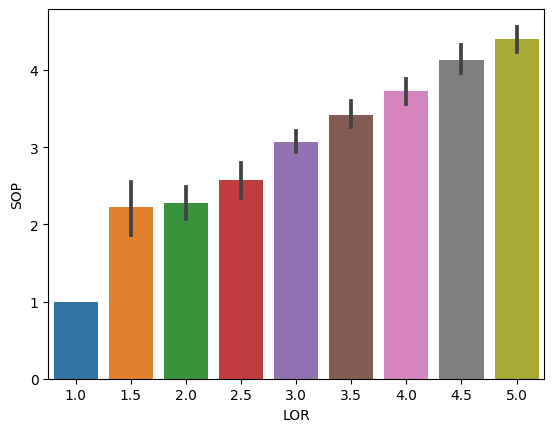

In [54]:
sns.barplot(data = data, x = 'LOR', y = 'SOP')
plt.show()

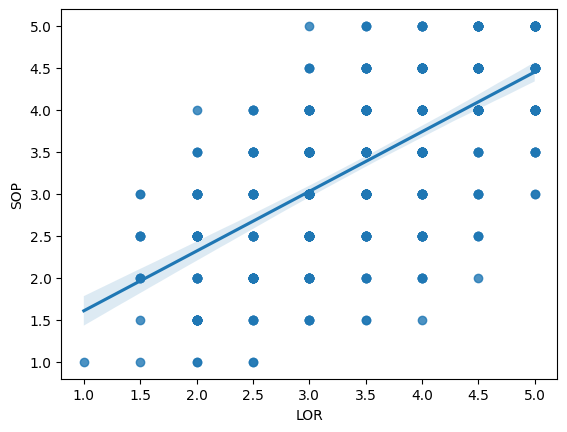

In [55]:
sns.regplot(data = data, x = 'LOR', y = 'SOP')
plt.show()

Observations:
1. The plot shows some association between the SOP and LOR variables. 

In [56]:
check_association(data, 'SOP','LOR')

1.2187954249518449e-57
Rejected Null Hypothesis.
There is significant association between the two variables.


Observations:
1. The chi square test shows that there is a significant association between the SOP and LOR.

In [57]:
corr_hypo_test(data = data, var1 = 'SOP', var2 = 'LOR', test = 'spearman')

The correlation coefficient is 0.6626528953712509 and p value is 1.590322408256286e-64.
Rejected Null Hypothesis.
Result: There is a correlation between the SOP and the LOR.


Observations:
1. The Spearman test shows that there is a significantly moderate to strong positive monotonic relationship between SOP and LOR.

In [58]:
corr_hypo_test(data = data, var1 = 'SOP', var2 = 'LOR', test = 'kendall')

The correlation coefficient is 0.5356409825122319 and p value is 1.0014534219862786e-55.
Rejected Null Hypothesis.
Result: There is a correlation between the SOP and the LOR.


Observations:
1. The Kendall Tau test shows that there is a significant relationship between SOP and LOR.

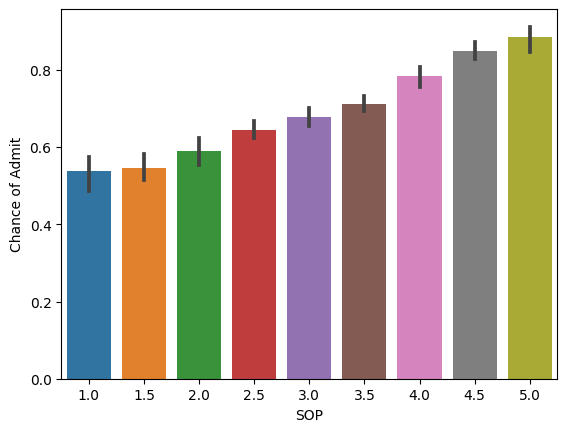

In [59]:
sns.barplot(data = data, x = 'SOP', y = 'Chance of Admit')
plt.show()

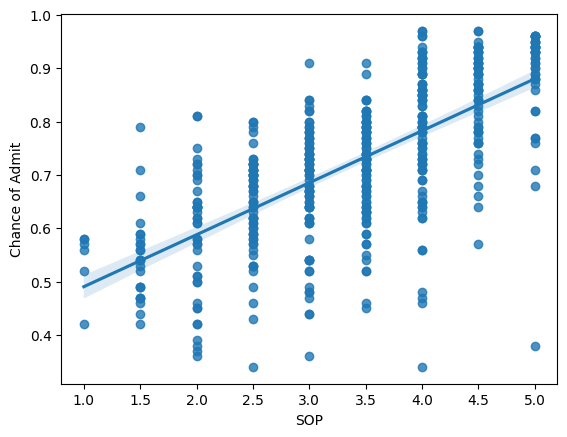

In [60]:
sns.regplot(data = data, x = 'SOP', y = 'Chance of Admit')
plt.show()

Onservations:
1. The visuals show that the chance of admit increase as the SOP increases.

In [61]:
# Testing is there is significance difference between the average chance of admit for each SOP ratings
test_anova(data, 'SOP', 'Chance of Admit')

P value: 2.1804735782708778e-64. Rejected Null Hypothesis.
The means are different


Observarions:
1. The ANOVA test shows that there is significant difference in the average chance of admit between each SOP ratings.

In [62]:
corr_hypo_test(data, 'SOP', 'Chance of Admit')

The correlation coefficient is 0.6841365241316721 and p value is 2.8859074534553888e-70.
Rejected Null Hypothesis.
Result: There is a correlation between the SOP and the Chance of Admit.


Observations:
1. The pearson correlation test shows that there is moderate to strong correlation between SOP and Chance of admit.

In [63]:
multi_cat_ttest_hypo_test(data, 'SOP', 'Chance of Admit')

p value: 4.756431742082409e-06. Rejected Null Hypothesis.
Result: The average Chance of Admit for students with SOP 4.0 is less than the average Chance of Admit for students with SOP 5.0
p value: 1.276548724123607e-08. Rejected Null Hypothesis.
Result: The average Chance of Admit for students with SOP 3.0 is less than the average Chance of Admit for students with SOP 4.0
p value: 1.034237138375671e-16. Rejected Null Hypothesis.
Result: The average Chance of Admit for students with SOP 3.5 is less than the average Chance of Admit for students with SOP 4.5
p value: 2.1248824197367504e-05. Rejected Null Hypothesis.
Result: The average Chance of Admit for students with SOP 2.0 is less than the average Chance of Admit for students with SOP 3.0
p value: 3.772695188282525e-06. Rejected Null Hypothesis.
Result: The average Chance of Admit for students with SOP 1.5 is less than the average Chance of Admit for students with SOP 2.5
p value: 7.740091673911279e-06. Rejected Null Hypothesis.
Result

Observations:
1. The ttest shows that as the SOP increase, the chance of admission also increases.

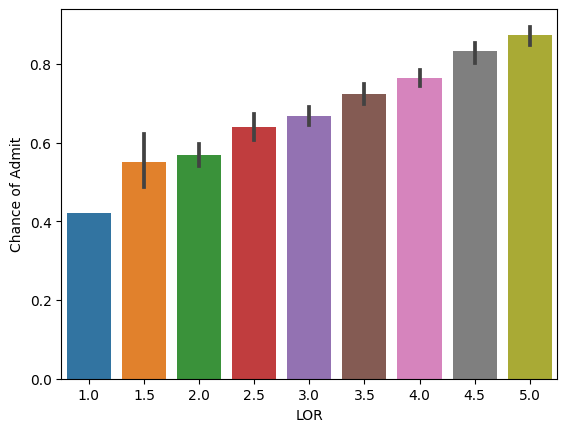

In [64]:
sns.barplot(data = data, x = 'LOR', y = 'Chance of Admit')
plt.show()

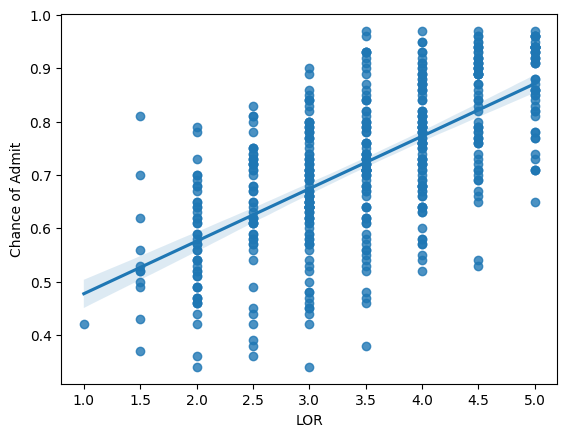

In [65]:
sns.regplot(data = data, x = 'LOR', y = 'Chance of Admit')
plt.show()

Observations:
1. The plot shows that there is a linearly increasing relationship between LOR and Chance of Admit.

In [66]:
test_anova(data, 'LOR', 'Chance of Admit')

P value: 1.2475714296300456e-53. Rejected Null Hypothesis.
The means are different


Observations:
1. The ANOVA test shows that the average Chance of Admit between the students with different LOR are are different.

In [67]:
multi_cat_ttest_hypo_test(data, 'LOR', 'Chance of Admit')

p value: 2.6776227740942104e-08. Rejected Null Hypothesis.
Result: The average Chance of Admit for students with LOR 3.5 is less than the average Chance of Admit for students with LOR 4.5
p value: 8.333212732791875e-05. Rejected Null Hypothesis.
Result: The average Chance of Admit for students with LOR 2.5 is less than the average Chance of Admit for students with LOR 3.5
p value: 1.91551641718487e-09. Rejected Null Hypothesis.
Result: The average Chance of Admit for students with LOR 3.0 is less than the average Chance of Admit for students with LOR 4.0
p value: 1.1074708358354634e-09. Rejected Null Hypothesis.
Result: The average Chance of Admit for students with LOR 4.0 is less than the average Chance of Admit for students with LOR 5.0
p value: 0.011976591641969236. Rejected Null Hypothesis.
Result: The average Chance of Admit for students with LOR 1.5 is less than the average Chance of Admit for students with LOR 2.5
p value: 3.812866873343849e-07. Rejected Null Hypothesis.
Result:

Observations:
1. The ttest shows that the chance of admissions increases if the students have higher rated LOR.

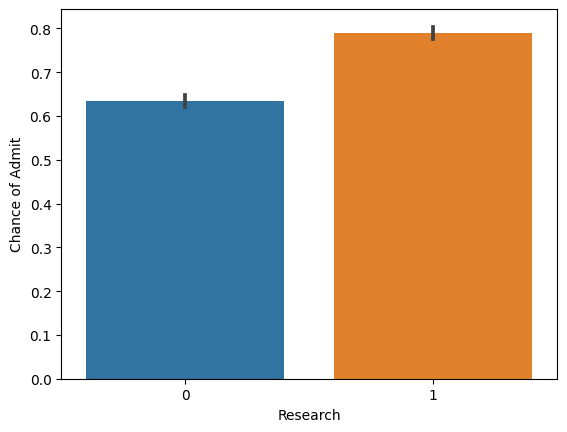

In [68]:
sns.barplot(data = data, x = 'Research', y = 'Chance of Admit')
plt.show()

Observations:
1. The visuals show that students with research experience have higher average chance of admits.

In [69]:
multi_cat_ttest_hypo_test(data, 'Research', 'Chance of Admit')

p value: 1.7977467729204891e-40. Rejected Null Hypothesis.
Result: The average Chance of Admit for students with Research 0 is less than the average Chance of Admit for students with Research 1


Observations:
1. There is significance evidence that students who have Research experience might have higher average chance of admissions.

##### Correlations

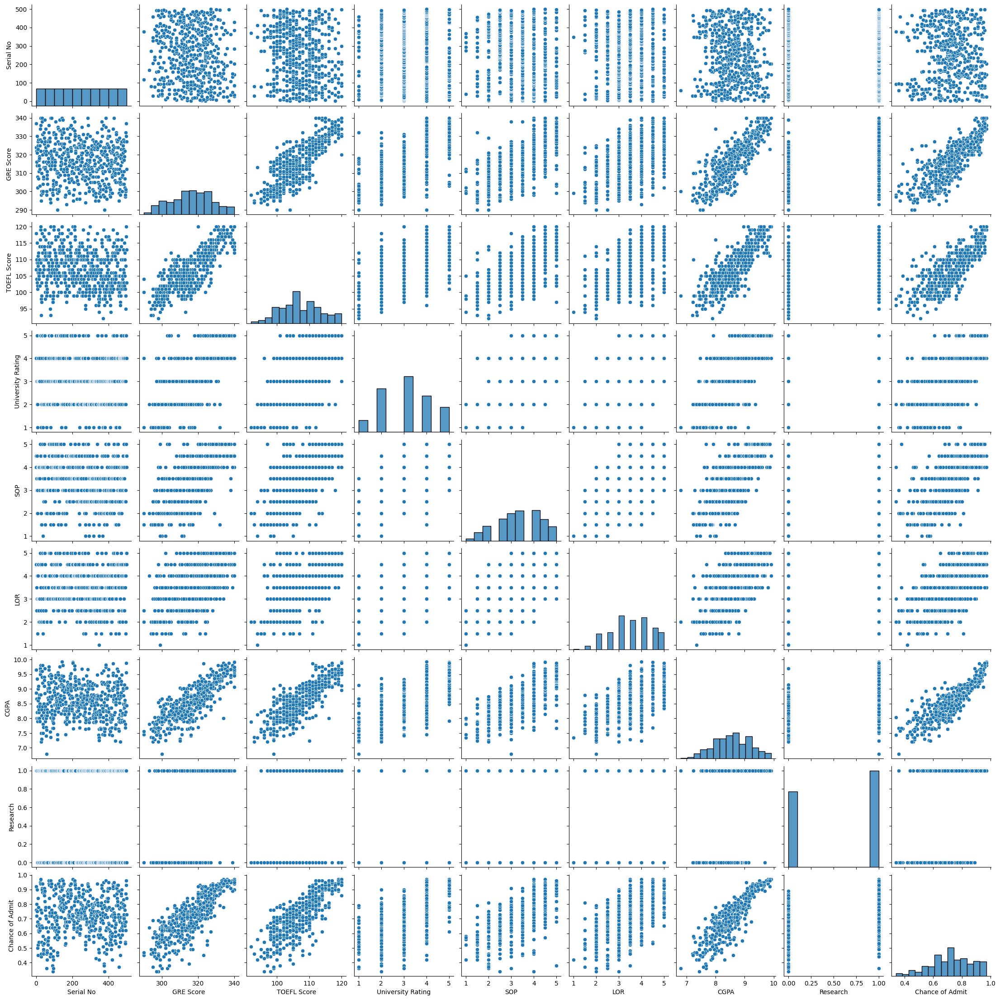

In [70]:
sns.pairplot(data = data)
plt.show()

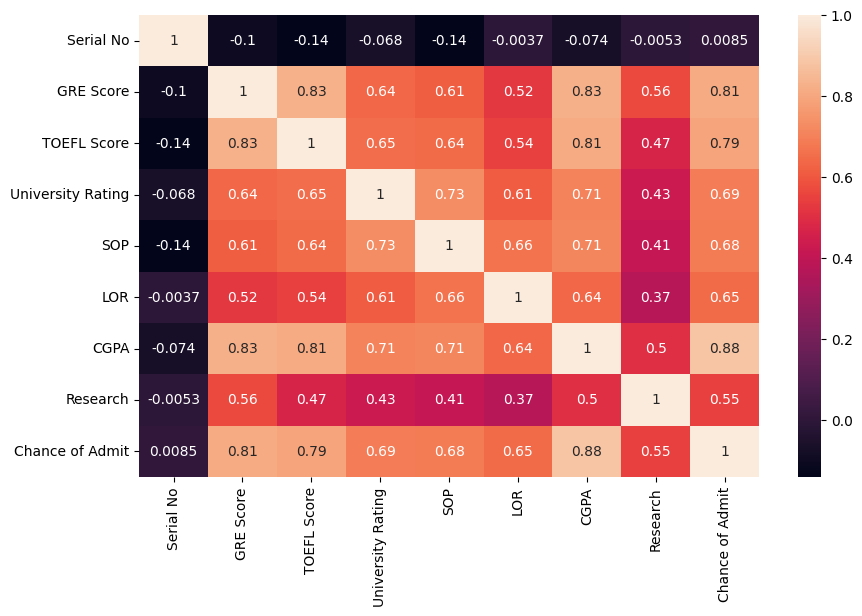

In [71]:
plt.figure(figsize = (10,6))
sns.heatmap(data.corr(), annot = True)
plt.show()

Observations:
1. The plots show significantly strong correlation between the 'Chance of Admit' with 'CGPA', 'GRE Score', 'TOEFL Score'.
2. The plots show moderate correlation between the 'Chance of Admit' with 'University Ranking', 'SOP', 'LOR' and 'Research'.
3. There is significant correlation between the CGPA, GRE Score and the TOEFL Score.
4. There is moderate correlation between the SOP and LOR.

##### Checking Duplicates

In [72]:
print(f"There are {data.duplicated().sum()} rows in the dataset.")

There are 0 rows in the dataset.


Observations:
1. There are no duplicates in the dataset.

##### Checking missing values

In [73]:
data.isnull().sum()

Serial No            0
GRE Score            0
TOEFL Score          0
University Rating    0
SOP                  0
LOR                  0
CGPA                 0
Research             0
Chance of Admit      0
dtype: int64

Observations:
1. There are no missing values in the dataset.

### Creating new Features

In [74]:
data['average scores'] = (data['GRE Score'] + data['TOEFL Score']) / 2
data['CGPA_GRE'] = data['CGPA'] * data['GRE Score']
data['CGPA_TOEFL'] = data['CGPA'] * data['TOEFL Score']
data['SOP_LOR'] = data['SOP'] * data['LOR']
data['GRE_Score_sq'] = data['GRE Score']**2
data['GRE_Score_cb'] = data['GRE Score']**3
data['TOELF_Score_sq'] = data['TOEFL Score']**2
data['TOELF_Score_cb'] = data['TOEFL Score']**3
data['CGPA_GRE_sq'] = data['CGPA_GRE']**2
data['CGPA_GRE_cb'] = data['CGPA_GRE']**3
data['CGPA_TOEFL_sq'] = data['CGPA_TOEFL']**2
data['CGPA_TOEFL_cb'] = data['CGPA_TOEFL']**3
data['CGPA_sq'] = data['CGPA']**2
data['CGPA_cb'] = data['CGPA']**3

data.head()

,Serial No,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit,average scores,...,GRE_Score_sq,GRE_Score_cb,TOELF_Score_sq,TOELF_Score_cb,CGPA_GRE_sq,CGPA_GRE_cb,CGPA_TOEFL_sq,CGPA_TOEFL_cb,CGPA_sq,CGPA_cb
0,1,337,118,4,4.5,4.5,9.65,1,0.92,227.5,...,113569,38272753,13924,1643032,1.057583e+07,3.439313e+10,1.296638e+06,1.476481e+09,93.1225,898.632125
1,2,324,107,4,4.0,4.5,8.87,1,0.76,215.5,...,104976,34012224,11449,1225043,8.259186e+06,2.373591e+10,9.007718e+05,8.549135e+08,78.6769,697.864103
2,3,316,104,3,3.0,3.5,8.00,1,0.72,210.0,...,99856,31554496,10816,1124864,6.390784e+06,1.615590e+10,6.922240e+05,5.759304e+08,64.0000,512.000000
3,4,322,110,3,3.5,2.5,8.67,1,0.80,216.0,...,103684,33386248,12100,1331000,7.793812e+06,2.175830e+10,9.095437e+05,8.674318e+08,75.1689,651.714363
4,5,314,103,2,2.0,3.0,8.21,0,0.65,208.5,...,98596,30959144,10609,1092727,6.645775e+06,1.713241e+10,7.150901e+05,6.047016e+08,67.4041,553.387661


##### Correlations

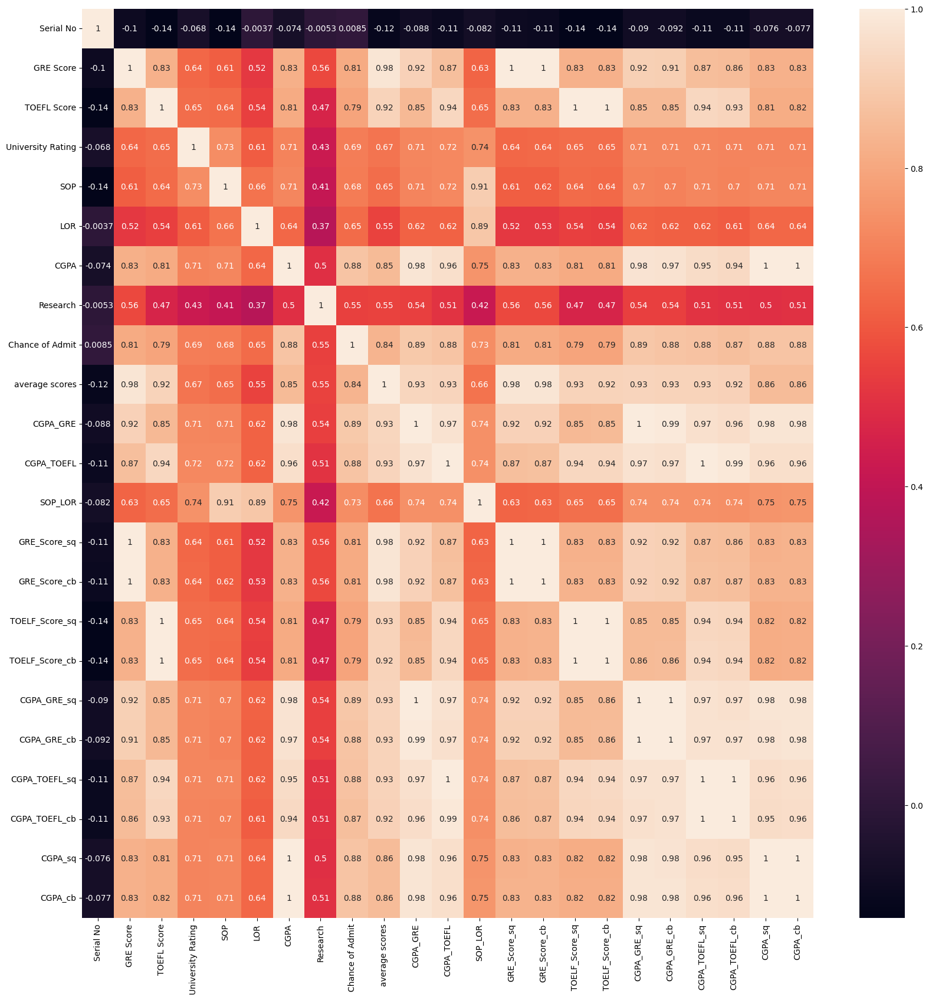

In [75]:
plt.figure(figsize = (20,20))
sns.heatmap(data.corr(), annot = True)
plt.show()

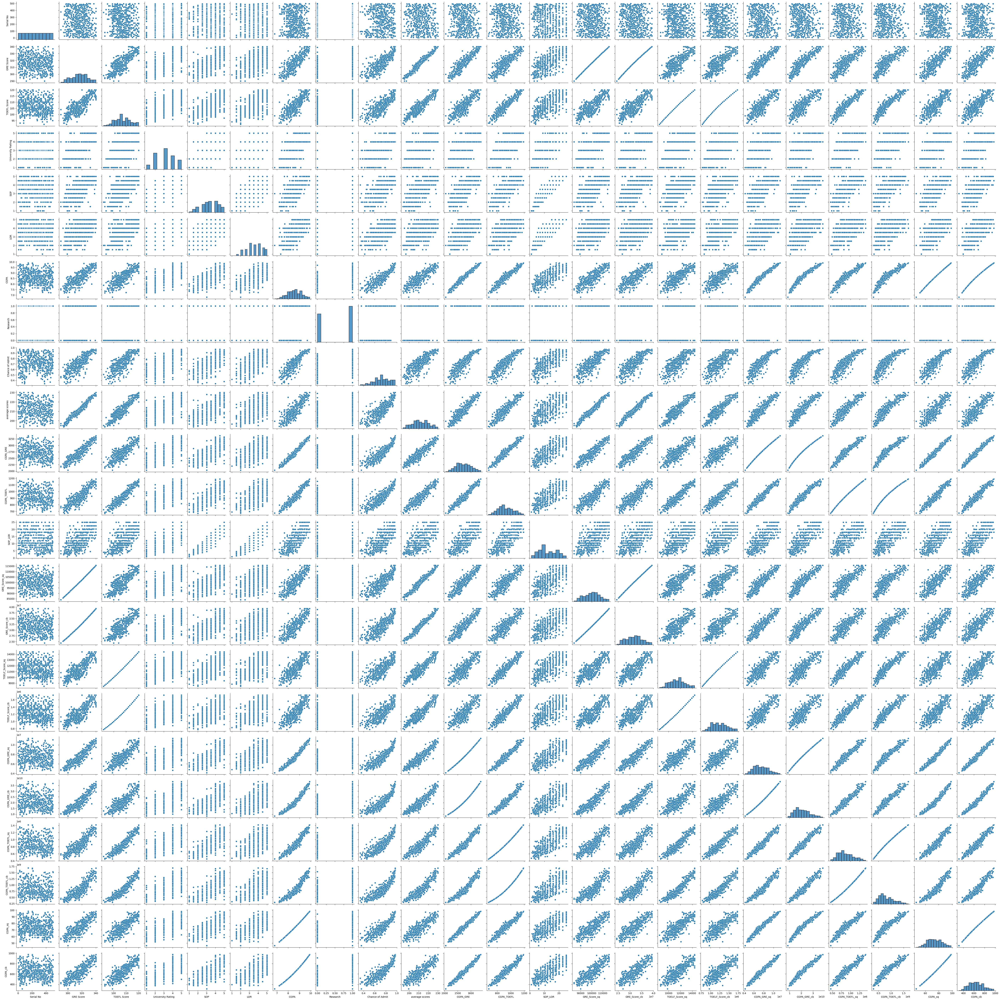

In [76]:
sns.pairplot(data)
plt.show()

In [77]:
#checking spearman correlation of features with dependent variable
data.corr(method = 'spearman')['Chance of Admit']

Serial No           -0.001733
GRE Score            0.822201
TOEFL Score          0.793634
University Rating    0.703742
SOP                  0.702799
LOR                  0.643627
CGPA                 0.888786
Research             0.565715
Chance of Admit      1.000000
average scores       0.844270
CGPA_GRE             0.901311
CGPA_TOEFL           0.887318
SOP_LOR              0.740513
GRE_Score_sq         0.822201
GRE_Score_cb         0.822201
TOELF_Score_sq       0.793634
TOELF_Score_cb       0.793634
CGPA_GRE_sq          0.901311
CGPA_GRE_cb          0.901311
CGPA_TOEFL_sq        0.887318
CGPA_TOEFL_cb        0.887318
CGPA_sq              0.888786
CGPA_cb              0.888786
Name: Chance of Admit, dtype: float64

Observations:
1. The quadratic and cubic variables of GRE Score has the same Spearman correlation coefficient as the GRE Score.
    - GRE Score = 0.822201
    - GRE_Score_sq = 0.822201
    - GRE_Score_cb = 0.822201
2. The quadratic and cubic variables of TOEFL Score has the same Spearman correlation coefficient as the TOEFL Score.
    - TOEFL Score          0.793634 
    - TOELF_Score_sq       0.793634
    - TOELF_Score_cb       0.793634
3. The average of GRE Score and TOEFL score is showing more correlation with Chance of Admit than them separately.
    - average scores       0.844270
4. The interative feature (product of SOP and LOR) shows more correlation with Chance of Admit than them being separate. 
    - SOP                  0.702799
    - LOR                  0.643627
    - SOP_LOR              0.740513
5. The quadratic and cubic variables of CGPA has the same Spearman correlation coefficient as the CGPA.
    - CGPA                 0.888786
    - CGPA_sq              0.888786
    - CGPA_cb              0.888786
6. The interactive feature (product of CGPA and GRE) shows more correlation with Chance of Admit than them being separate. However, the squared and cubed versions are not changing the corrrelation.
    - CGPA_GRE             0.901311
    - CGPA_GRE_sq          0.901311
    - CGPA_GRE_cb          0.901311
7. The interactive feature (product of CGPA and TOEFL) shows more correlation with Chance of Admit than TOEFL individually but lesser than CGPA individually. However, the squared and cubed versions are not changing the corrrelation.
    - CGPA_TOEFL           0.887318
    - CGPA_TOEFL_sq        0.887318
    - CGPA_TOEFL_cb        0.887318
8. The interaction between features are showing more correlation with the target variable (Chance of Admit) than the individual features. The quadratic and cubic variables are not better.

In [78]:
#checking pearson correlation of features with dependent variable
data.corr(method = 'pearson')['Chance of Admit']

Serial No            0.008505
GRE Score            0.810351
TOEFL Score          0.792228
University Rating    0.690132
SOP                  0.684137
LOR                  0.645365
CGPA                 0.882413
Research             0.545871
Chance of Admit      1.000000
average scores       0.837609
CGPA_GRE             0.893037
CGPA_TOEFL           0.883211
SOP_LOR              0.732118
GRE_Score_sq         0.811046
GRE_Score_cb         0.811407
TOELF_Score_sq       0.792257
TOELF_Score_cb       0.791448
CGPA_GRE_sq          0.889770
CGPA_GRE_cb          0.883614
CGPA_TOEFL_sq        0.877588
CGPA_TOEFL_cb        0.868338
CGPA_sq              0.882555
CGPA_cb              0.881110
Name: Chance of Admit, dtype: float64

Observations:
1. The quadratic and cubic variables of GRE Score has more Pearson correlation coefficient than the GRE Score. The cubic variable has the most Pearson correlation.
    - GRE Score = 0.810351
    - GRE_Score_sq = 0.811046
    - GRE_Score_cb = 0.811407
2. The quadratic variable has slightly more Pearson correlation than TOEFL Score. The cubic variable of TOEFL Score has lesser Pearson correlation coefficient than the TOEFL Score. The slight increase in the quadratic cariable is negligible.
    - TOEFL Score = 0.792228
    - TOELF_Score_sq = 0.792257
    - TOELF_Score_cb = 0.791448
3. The average of GRE Score and TOEFL score is showing more Pearson correlation with Chance of Admit than them separately.
    - average scores = 0.837609
4. The interative feature (product of SOP and LOR) shows more Pearson correlation with Chance of Admit than them being separate.
    - SOP = 0.684137
    - LOR = 0.645365
    - SOP_LOR = 0.732118
5. The quadratic variable of CGPA has slightly more Pearson correlation than CGPA individually. The cubic variable of CGPA has slightly lesser Pearson correlation coefficient than CGPA. The slight difference is negligible.
    - CGPA = 0.882413
    - CGPA_sq = 0.882555
    - CGPA_cb = 0.881110
6. The interactive feature (product of CGPA and GRE) shows more Pearson correlation with Chance of Admit than them being separate. However, the quadratic and cubic versions show lesser Pearson correlation than CGPA_GRE.
    - CGPA_GRE = 0.893037
    - CGPA_GRE_sq = 0.889770
    - CGPA_GRE_cb = 0.883614
7. The interactive feature (product of CGPA and TOEFL) shows more Pearson correlation with Chance of Admit than TOEFL individually but only slightly more than CGPA individually. However, the quadratic and cubic versions are lesser than CGPA_TOEFL variable.
    - CGPA_TOEFL = 0.883211
    - CGPA_TOEFL_sq = 0.877588
    - CGPA_TOEFL_cb = 0.868338
8. The interaction between features are showing more Pearson correlation with the target variable (Chance of Admit) than the individual features. The quadratic and the cubic variables are not better.

### Model Building

##### Checking Ordinary Least Squares Regression

In [79]:
# All features without scaling
X = data.drop(['Serial No', 'Chance of Admit'], axis = 1)
Y = data['Chance of Admit']

#splitting train and test data
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size = 0.2, random_state = 0)

#adding constants for bias parameter
x_sm = sm.add_constant(X_train)

#performing OLS
lr = sm.OLS(Y_train, x_sm)
results = lr.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:        Chance of Admit   R-squared:                       0.834
Model:                            OLS   Adj. R-squared:                  0.826
Method:                 Least Squares   F-statistic:                     100.6
Date:                Sat, 20 Apr 2024   Prob (F-statistic):          3.09e-135
Time:                        10:18:37   Log-Likelihood:                 570.44
No. Observations:                 400   AIC:                            -1101.
Df Residuals:                     380   BIC:                            -1021.
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 1.4573      2.48

In [80]:
y_preds = results.predict(x_sm)
print(f"Train Root Mean Squared Error: {round(np.sqrt(np.mean((Y_train-y_preds) ** 2)),3)}")

#adding bias constants in test data
x_sm_test = sm.add_constant(X_test)
y_preds = results.predict(x_sm_test)
print(f"Test Root Mean Squared Error: {round(np.sqrt(np.mean((Y_test-y_preds) ** 2)),3)}")

Train Root Mean Squared Error: 0.058
Test Root Mean Squared Error: 0.065


In [81]:
# All features after scaling
X = data.drop(['Serial No', 'Chance of Admit'], axis = 1)
Y = data['Chance of Admit']

#train test split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size = 0.2, random_state = 0)

#normalizing te data
sc = StandardScaler()
x_train_sc = sc.fit_transform(X_train)
x_test_sc = sc.transform(X_test)

#Creating features list
features = list(X_train.columns)

x_train_sc_df = pd.DataFrame(x_train_sc, columns = features)
x_train_sc_sm = sm.add_constant(x_train_sc_df) 
x_test_sc_df = pd.DataFrame(x_test_sc, columns = features)
x_test_sc_sm = sm.add_constant(x_test_sc_df) 

#performing OLS
lr_sc = sm.OLS(Y_train.values.reshape(-1,1), x_train_sc_sm)
results_sc = lr_sc.fit()
results_sc.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.835
Model:                            OLS   Adj. R-squared:                  0.826
Method:                 Least Squares   F-statistic:                     95.87
Date:                Sat, 20 Apr 2024   Prob (F-statistic):          1.18e-134
Time:                        10:18:37   Log-Likelihood:                 571.49
No. Observations:                 400   AIC:                            -1101.
Df Residuals:                     379   BIC:                            -1017.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.7266      0.003    243.954      0.000       0.721       0.732
GRE Score            14.7180     12.874      1.143      0.254     -10.595      40.031
TOEFL Score          -8.1866     10.657     -0.768      0.443     -29.141      12.768
University Rating     0.0058      0.005      1.185      0.237      -0.004       0.015
SOP                  -0.0055      0.013     -0.414      0.679      -0.032       0.021
LOR                   0.0138      0.012      1.124      0.262      -0.010       0.038
CGPA                 32.6387     21.406      1.525      0.128      -9.451      74.728
Research              0.0119      0.004      3.230      0.001       0.005       0.019
average scores        6.8957      6.066      1.137      0.256      -5.031      18.822
CGPA_GRE            -55.4533     42.976     -1.290      0.198    -139.954      29.047
CGPA_TOEFL           11.2164     21.345      0.525      0.600     -30.753      53.186
SOP_LOR               0.0101      0.023      0.445      0.657      -0.034       0.055
GRE_Score_sq        -19.6667     24.983     -0.787      0.432     -68.790      29.456
GRE_Score_cb          6.8115     11.928      0.571      0.568     -16.642      30.265
TOELF_Score_sq        6.0815     11.102      0.548      0.584     -15.748      27.911
TOELF_Score_cb       -2.1778      4.572     -0.476      0.634     -11.167       6.811
CGPA_GRE_sq          55.7030     43.081      1.293      0.197     -29.004     140.410
CGPA_GRE_cb         -18.8969     14.525     -1.301      0.194     -47.457       9.663
CGPA_TOEFL_sq       -11.2710     21.591     -0.522      0.602     -53.723      31.181
CGPA_TOEFL_cb         3.7841      7.342      0.515      0.607     -10.652      18.220
CGPA_sq             -33.3657     21.520     -1.550      0.122     -75.680       8.948
CGPA_cb              11.5708      7.567      1.529      0.127      -3.308      26.449
==============================================================================
Omnibus:                       97.787   Durbin-Watson:                   2.062
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              237.831
Skew:                          -1.207   Prob(JB):                     2.27e-52
Kurtosis:                       5.906   Cond. No.                     2.37e+16
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.21e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [82]:
y_preds = results_sc.predict(x_train_sc_sm)
print(f"Train Root Mean Squared Error: {round(np.sqrt(np.mean((Y_train-y_preds) ** 2)),3)}")
y_preds = results_sc.predict(x_test_sc_sm)
print(f"The Root Mean Squared Error: {round(np.sqrt(np.mean((Y_test-y_preds) ** 2)),3)}")

Train Root Mean Squared Error: 0.197
The Root Mean Squared Error: 0.116


In [83]:
from sklearn.preprocessing import MinMaxScaler

In [83]:
# Original features
X = data[['Serial No', 'GRE Score', 'TOEFL Score', 'University Rating', 'SOP',
       'LOR', 'CGPA', 'Research']]
Y = data['Chance of Admit']

# train and test split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size = 0.2, random_state = 0)

x_train_serial = X_train[['Serial No']]
x_ttest_serial = X_test[['Serial No']]
X_train = X_train.drop(['Serial No'], axis=1)
X_test = X_test.drop(['Serial No'], axis=1)

#normalization
sc = StandardScaler()
x_train_sc = sc.fit_transform(X_train)
x_test_sc = sc.transform(X_test)

features = list(X_train.columns)

x_train_sc_df = pd.DataFrame(x_train_sc, columns = features)
x_train_sc_sm = sm.add_constant(x_train_sc_df) 
x_test_sc_df = pd.DataFrame(x_test_sc, columns = features)
x_test_sc_sm = sm.add_constant(x_test_sc_df) 

#performing OLS
lr_sc = sm.OLS(Y_train.values.reshape(-1,1), x_train_sc_sm)
results_sc = lr_sc.fit()
results_sc.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.832
Model:                            OLS   Adj. R-squared:                  0.829
Method:                 Least Squares   F-statistic:                     277.5
Date:                Fri, 19 Apr 2024   Prob (F-statistic):          1.36e-147
Time:                        19:04:24   Log-Likelihood:                 568.04
No. Observations:                 400   AIC:                            -1120.
Df Residuals:                     392   BIC:                            -1088.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.7266      0.003    245.975      0.000       0.721       0.732
GRE Score             0.0242      0.006      3.852      0.000       0.012       0.037
TOEFL Score           0.0171      0.006      2.950      0.003       0.006       0.029
University Rating     0.0063      0.005      1.339      0.181      -0.003       0.016
SOP                   0.0005      0.005      0.103      0.918      -0.009       0.010
LOR                   0.0189      0.004      4.454      0.000       0.011       0.027
CGPA                  0.0701      0.006     10.796      0.000       0.057       0.083
Research              0.0119      0.004      3.354      0.001       0.005       0.019
==============================================================================
Omnibus:                       89.207   Durbin-Watson:                   2.022
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              204.699
Skew:                          -1.126   Prob(JB):                     3.55e-45
Kurtosis:                       5.685   Cond. No.                         5.69
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [84]:
y_preds = results_sc.predict(x_train_sc_sm)
print(f"Train Root Mean Squared Error: {round(np.sqrt(np.mean((Y_train-y_preds) ** 2)),3)}")
y_preds = results_sc.predict(x_test_sc_sm)
print(f"The Root Mean Squared Error: {round(np.sqrt(np.mean((Y_test-y_preds) ** 2)),3)}")

Train Root Mean Squared Error: 0.197
The Root Mean Squared Error: 0.114


In [85]:
#Excluding University Ranking and SOP due to high p-value
X = data[['Serial No', 'GRE Score', 'TOEFL Score', 'LOR', 'CGPA', 'Research']]
Y = data['Chance of Admit']

#train and test split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size = 0.2, random_state = 0)

x_train_serial = X_train[['Serial No']]
x_ttest_serial = X_test[['Serial No']]
X_train = X_train.drop(['Serial No'], axis=1)
X_test = X_test.drop(['Serial No'], axis=1)

#normalizing
sc = StandardScaler()
x_train_sc = sc.fit_transform(X_train)
x_test_sc = sc.transform(X_test)

features = list(X_train.columns)

x_train_sc_df = pd.DataFrame(x_train_sc, columns = features)
x_train_sc_sm = sm.add_constant(x_train_sc_df) 
x_test_sc_df = pd.DataFrame(x_test_sc, columns = features)
x_test_sc_sm = sm.add_constant(x_test_sc_df) 

#performing OLS
lr_sc = sm.OLS(Y_train.values.reshape(-1,1), x_train_sc_sm)
results_sc = lr_sc.fit()
results_sc.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.831
Model:                            OLS   Adj. R-squared:                  0.829
Method:                 Least Squares   F-statistic:                     387.9
Date:                Fri, 19 Apr 2024   Prob (F-statistic):          1.02e-149
Time:                        19:04:24   Log-Likelihood:                 566.95
No. Observations:                 400   AIC:                            -1122.
Df Residuals:                     394   BIC:                            -1098.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.7266      0.003    245.926      0.000       0.721       0.732
GRE Score       0.0249      0.006      3.977      0.000       0.013       0.037
TOEFL Score     0.0184      0.006      3.216      0.001       0.007       0.030
LOR             0.0207      0.004      5.398      0.000       0.013       0.028
CGPA            0.0719      0.006     11.448      0.000       0.060       0.084
Research        0.0122      0.004      3.436      0.001       0.005       0.019
==============================================================================
Omnibus:                       87.741   Durbin-Watson:                   2.022
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              200.645
Skew:                          -1.110   Prob(JB):                     2.69e-44
Kurtosis:                       5.667   Cond. No.                         4.83
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [86]:
y_preds = results_sc.predict(x_train_sc_sm)
print(f"Train Root Mean Squared Error: {round(np.sqrt(np.mean((Y_train-y_preds) ** 2)),3)}")
y_preds = results_sc.predict(x_test_sc_sm)
print(f"The Root Mean Squared Error: {round(np.sqrt(np.mean((Y_test-y_preds) ** 2)),3)}")

Train Root Mean Squared Error: 0.197
The Root Mean Squared Error: 0.114


In [87]:
# variables highly correlated to Chance of Admit
X_fe = data[['Serial No','University Rating', 'Research', 'average scores',
       'CGPA_GRE', 'CGPA_TOEFL', 'SOP_LOR']]
Y_fe = data['Chance of Admit']

#splitting data into train and test sets
X_train_fe, X_test_fe, Y_train_fe, Y_test_fe = train_test_split(X_fe,Y_fe,test_size = 0.2, random_state = 0)

x_train_serial_fe = X_train_fe[['Serial No']]
x_ttest_serial_fe = X_test_fe[['Serial No']]
X_train_fe = X_train_fe.drop(['Serial No'], axis=1)
X_test_fe = X_test_fe.drop(['Serial No'], axis=1)

#normalizing
sc_fe = StandardScaler()
x_train_sc_fe = sc_fe.fit_transform(X_train_fe)
x_test_sc_fe = sc_fe.transform(X_test_fe)

features_fe = list(X_train_fe.columns)

x_train_sc_df_fe = pd.DataFrame(x_train_sc_fe, columns = features_fe)
x_train_sc_sm_fe = sm.add_constant(x_train_sc_df_fe) 
x_test_sc_df_fe = pd.DataFrame(x_test_sc_fe, columns = features_fe)
x_test_sc_sm_fe = sm.add_constant(x_test_sc_df_fe) 

#performing OLS
lr_sc_fe = sm.OLS(Y_train_fe.values.reshape(-1,1), x_train_sc_sm_fe)
results_sc_fe = lr_sc_fe.fit()
results_sc_fe.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.827
Model:                            OLS   Adj. R-squared:                  0.824
Method:                 Least Squares   F-statistic:                     312.1
Date:                Fri, 19 Apr 2024   Prob (F-statistic):          4.20e-146
Time:                        19:04:24   Log-Likelihood:                 561.55
No. Observations:                 400   AIC:                            -1109.
Df Residuals:                     393   BIC:                            -1081.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.7266      0.003    242.323      0.000       0.721       0.732
University Rating     0.0048      0.005      1.012      0.312      -0.005       0.014
Research              0.0126      0.004      3.513      0.000       0.006       0.020
average scores       -0.0007      0.009     -0.079      0.937      -0.019       0.017
CGPA_GRE              0.0722      0.013      5.510      0.000       0.046       0.098
CGPA_TOEFL            0.0336      0.013      2.561      0.011       0.008       0.059
SOP_LOR               0.0193      0.005      3.856      0.000       0.009       0.029
==============================================================================
Omnibus:                       90.645   Durbin-Watson:                   1.996
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              200.223
Skew:                          -1.161   Prob(JB):                     3.33e-44
Kurtosis:                       5.573   Cond. No.                         12.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [88]:
y_preds_fe = results_sc_fe.predict(x_train_sc_sm_fe)
print(f"Train Root Mean Squared Error: {round(np.sqrt(np.mean((Y_train-y_preds_fe) ** 2)),3)}")
y_preds_fe = results_sc_fe.predict(x_test_sc_sm_fe)
print(f"The Root Mean Squared Error: {round(np.sqrt(np.mean((Y_test_fe-y_preds_fe) ** 2)),3)}")

Train Root Mean Squared Error: 0.196
The Root Mean Squared Error: 0.114


Onservations:
1. All features without scaling (original and engineered) included:
     - R-squared:                       0.834
     - Adj. R-squared:                  0.826
     - Prob (F-statistic):          3.09e-135
     - Train RMSE:                      0.058
     - Test RMSE:                       0.065
2. All features with scaling (original and engineered) included:
     - R-squared:                       0.835
     - Adj. R-squared:                  0.826
     - Prob (F-statistic):          1.18e-134
     - Train RMSE:                      0.197
     - Test RMSE:                       0.116
3. Only Original features:
     - R-squared:                       0.832
     - Adj. R-squared:                  0.829
     - Prob (F-statistic):          1.36e-147
     - Train RMSE:                      0.197
     - Test RMSE:                       0.114
4. Only Original features (excluding University Rating and SOP due to high p > [t]:
     - R-squared:                       0.831
     - Adj. R-squared:                  0.829
     - Prob (F-statistic):          1.02e-149
     - Train RMSE:                      0.197
     - Test RMSE:                       0.114
5. Using only independent variables highly correlated to Chance of Admit ('University Rating', 'Research', 'average scores',
       'CGPA_GRE', 'CGPA_TOEFL', 'SOP_LOR'):
     - R-squared:                       0.827
     - Adj. R-squared:                  0.824
     - Prob (F-statistic):          4.20e-146
     - Train RMSE:                      0.196
     - Test RMSE:                       0.114

##### Note : Lasso and Ridge models are performed after the below section 'Testing the assumptions of linear regression'

### Testing the assumptions of linear regression

##### 1. Checking Multicollinearity

In [89]:
def get_r2_adjr2_lr(df1, exclude_features2, target_feature2 = 'Chance of Admit'):
    """
    This function performs linear regressions and calculates the adjusted R2 score for the train and test datasets
    Input:
        df1: pandas dataset
        exclude_features2 : list of column names to be dropped.
        target_feature2: the column name to be considered as the target. default is 'Chance of Admit'
    Output:
        returns a tuple with adjusted r2 score for the train dataset and test dataset
        
    """
    #creating X and Y variables
    X = df1.drop(exclude_features2, axis = 1)
    Y = df1[target_feature2]
    
    #train and test split
    xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size = 0.2, random_state = 0)
    
    #normalization
    sc = StandardScaler()
    xtrain_sc = sc.fit_transform(xtrain)
    xtest_sc = sc.transform(xtest)
    
    #performing Linear Regression
    lr = LinearRegression()
    lr.fit(xtrain_sc, ytrain)
    #getting the R2 scores and calculating the adjusted R2 scores
    r2_train = lr.score(xtrain_sc, ytrain)
    adj_r2_train = 1 - (((1-r2_train)*(xtrain.shape[0]-1))/(xtrain.shape[0] - xtrain.shape[1] - 1))
    r2_test = lr.score(xtest_sc, ytest)
    adj_r2_test = 1 - (((1-r2_test)*(xtest.shape[0]-1))/(xtest.shape[0] - xtest.shape[1] - 1))
    return (adj_r2_train,adj_r2_test)


In [90]:
def remove_multicollinear_features(df, exclude_features = ('Serial No','Chance of Admit'), vif_check_value = 1, adj_r2_check = True):
    """
    This function performs Variance Inflation Factor analysis on the provided dataset
    to identify and remove features with high VIF value. This function can be used along with checking the 
    adjusted R2 score for the remaining features to see if the adjusted R2 score decreases if we remove a feature with 
    high VIF value.
    Input:
        df: pandas dataframe
        exclude_feature: initial list of features to be excluded from the analysis
        vif_check_value: the threshold for the VIF value if adj_r2_check = False. Features that have VIF value greater than 
                         this value will be removed
        adj_r2_check: if True, adjusted R2 score check is done on the remaining features.
    Output:
        returns the list of features identified that can balance between multicollinearity and decent adjusted R2 score.
    """
    #initializing the exclude features
    
    vif_exclude_features1 = list(exclude_features)
    exclude_feat1 = list(exclude_features)
    
    #perform linear regression and get the adjusted R2 score
    prev_adj_r2 = get_r2_adjr2_lr(df, exclude_feat1)[0]

    adj_r2_train = 0
    
    #Running a loop to perform VIF repeatedly
    while True:
        #creating a dataframe with features and their VIF values
        features1 = df.drop(vif_exclude_features1, axis = 1).columns
        vif = pd.DataFrame()
        vif['variables'] = features1
        #getting the VIF value for all features
        vif['vif'] = [variance_inflation_factor(df[features1].values, i) for i in range(df[features1].shape[1])]
        
        #Getting the features with the max VIF value
        vif_list1 = vif[vif['vif'] == vif['vif'].max()].variables.values.tolist()
        #adding the features with max VIF value to the exclusion list
        if vif['vif'].max() > vif_check_value:
            exclude_feat1 += vif_list1
        else:
            break
        
        # check if adjusted R2 score is affected by the most recent exclution
        if adj_r2_check:
                #get the adjusted R2 score for the remaining features
                adj_r2_train,adj_r2_test = get_r2_adjr2_lr(df, exclude_feat1)
                
                if prev_adj_r2 > adj_r2_train:
                    break
                else:
                    vif_exclude_features1 = exclude_feat1
                    prev_adj_r2 = adj_r2_train
        else:
            vif_exclude_features1 = exclude_feat1

    #remove the most recent feature to adjust the above process
    exclude_feat1.pop()
    print("The VIF of the features are:")
    print(f"{vif}\n")
    if adj_r2_check:
        print(f"The final Adjusted R2 Score obtained is {prev_adj_r2}")
    all_features1 = df.drop(['Serial No', 'Chance of Admit'], axis = 1).columns.tolist()
    
    #getting the final features
    final_features1 = [i for i in df.columns.tolist() if i not in exclude_feat1]
    print(f"The features considered for analysis are:\n{all_features1}\n")
    if adj_r2_check:
        print(f"The Features chosen after VIF analysis and Adjusted R2 comparison is/are:\n{final_features1}")
    else:
        print(f"The Features chosen after VIF analysis is/are:\n{final_features1}")
    return final_features1

In [91]:
#VIF analysis on all the fearures (original + engineered)
features_to_use = remove_multicollinear_features(data)

The VIF of the features are:
           variables         vif
0  University Rating   22.451909
1                SOP  222.842716
2                LOR  221.634031
3               CGPA  474.372066
4           Research    3.419164
5            SOP_LOR  266.441168
6       GRE_Score_cb  455.856811
7     TOELF_Score_cb  145.276970
8        CGPA_GRE_cb   88.353318

The final Adjusted R2 Score obtained is 0.8293389721222677
The features considered for analysis are:
['GRE Score', 'TOEFL Score', 'University Rating', 'SOP', 'LOR', 'CGPA', 'Research', 'average scores', 'CGPA_GRE', 'CGPA_TOEFL', 'SOP_LOR', 'GRE_Score_sq', 'GRE_Score_cb', 'TOELF_Score_sq', 'TOELF_Score_cb', 'CGPA_GRE_sq', 'CGPA_GRE_cb', 'CGPA_TOEFL_sq', 'CGPA_TOEFL_cb', 'CGPA_sq', 'CGPA_cb']

The Features chosen after VIF analysis and Adjusted R2 comparison is/are:
['University Rating', 'SOP', 'LOR', 'CGPA', 'Research', 'SOP_LOR', 'GRE_Score_cb', 'TOELF_Score_cb', 'CGPA_GRE_cb']


Observations:
1. After the VIF analysis, the final features remaining are ['University Rating', 'SOP', 'LOR', 'CGPA', 'Research', 'SOP_LOR', 'GRE_Score_cb', 'TOELF_Score_cb', 'CGPA_GRE_cb']. Further removal of features is reducing the adjusted R2 score.
2. The final Adjusted R2 score is 0.8293389721222677.
3. The VIF of the features are:
     -              No        variables         vif
                    0  University Rating   22.451909
                    1                SOP  222.842716
                    2                LOR  221.634031
                    3               CGPA  474.372066
                    4           Research    3.419164
                    5            SOP_LOR  266.441168
                    6       GRE_Score_cb  455.856811
                    7     TOELF_Score_cb  145.276970
                    8        CGPA_GRE_cb   88.353318
4. There are many features with high VIF. However, removing these features is causing a decrease in the adjusted R2 score. This suggests that these features, despite having high multicollinearity, are still explaining a significant amount of variance in the dependent variable 'Chance of Admit'.

##### Checking linear regression model for features selected via VIF

In [92]:
# Linear Regression with all features
X = data.drop(['Serial No','Chance of Admit'], axis = 1)
Y = data[['Chance of Admit']]

#train test split
xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size = 0.2, random_state = 0)

#normalization
sc = StandardScaler()
xtrain_sc = sc.fit_transform(xtrain)
xtest_sc = sc.transform(xtest)

#performing Linear regression
lin_reg = LinearRegression()
lin_reg.fit(xtrain_sc, ytrain)

#getting R2 scores
r2_train = lin_reg.score(xtrain_sc, ytrain)
r2_test = lin_reg.score(xtest_sc, ytest)
print("Training data R2 score: ", r2_train)
print("Test data R2 score: ", r2_test)

#calculation adjusted R2 scores
adj_r2_train = 1 - (((1-r2_train)*(xtrain.shape[0]-1))/(xtrain.shape[0] - xtrain.shape[1] - 1))
adj_r2_test = 1 - (((1-r2_test)*(xtest.shape[0]-1))/(xtest.shape[0] - xtest.shape[1] - 1))
print("Training data adj R2 score: ", adj_r2_train)
print("Test data adj R2 score: ", adj_r2_test)

#predictions
ytrain_preds = lin_reg.predict(xtrain_sc)
ytest_preds = lin_reg.predict(xtest_sc)
errors_train = ytrain_preds - ytrain
errors_test = ytest_preds - ytest

Training data R2 score:  0.8349625503879538
Test data R2 score:  0.7626420106035784
Training data adj R2 score:  0.8257938031872845
Test data adj R2 score:  0.698737936535311


In [93]:
# Linear Regression with features selected through VIF and adj R2 analysis.
X = data[features_to_use]
Y = data[['Chance of Admit']]

#Train test split
xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size = 0.2, random_state = 0)

#Normalization
sc = StandardScaler()
xtrain_sc = sc.fit_transform(xtrain)
xtest_sc = sc.transform(xtest)

#performing Linear regression
lin_reg = LinearRegression()
lin_reg.fit(xtrain_sc, ytrain)

#getting the R2 score
r2_train = lin_reg.score(xtrain_sc, ytrain)
r2_test = lin_reg.score(xtest_sc, ytest)
print("Training data R2 score: ", r2_train)
print("Test data R2 score: ", r2_test)

#calculating adjusted R2 score
adj_r2_train = 1 - (((1-r2_train)*(xtrain.shape[0]-1))/(xtrain.shape[0] - xtrain.shape[1] - 1))
adj_r2_test = 1 - (((1-r2_test)*(xtest.shape[0]-1))/(xtest.shape[0] - xtest.shape[1] - 1))
print("Training data adj R2 score: ", adj_r2_train)
print("Test data adj R2 score: ", adj_r2_test)

#predictions
ytrain_preds = lin_reg.predict(xtrain_sc)
ytest_preds = lin_reg.predict(xtest_sc)
errors_train = ytrain_preds - ytrain
errors_test = ytest_preds - ytest

Training data R2 score:  0.8331884689916902
Test data R2 score:  0.7628614549451849
Training data adj R2 score:  0.8293389721222677
Test data adj R2 score:  0.7391476004397033


In [95]:
original_features_vif = remove_multicollinear_features(df = data[['Serial No', 'GRE Score', 'TOEFL Score', 'University Rating', 'SOP',
      'LOR', 'CGPA', 'Research', 'Chance of Admit']],vif_check_value = 10, adj_r2_check = False)
original_features_vif

The VIF of the features are:
     variables       vif
0  TOEFL Score  2.407952
1     Research  2.407952

The features considered for analysis are:
['GRE Score', 'TOEFL Score', 'University Rating', 'SOP', 'LOR', 'CGPA', 'Research']

The Features chosen after VIF analysis is/are:
['TOEFL Score', 'University Rating', 'Research']


['TOEFL Score', 'University Rating', 'Research']

In [96]:
#Linear Regression with original features

X = data[original_features_vif]
Y = data[['Chance of Admit']]

xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size = 0.2, random_state = 0)

sc = StandardScaler()
xtrain_sc = sc.fit_transform(xtrain)
xtest_sc = sc.transform(xtest)

lin_reg = LinearRegression()
lin_reg.fit(xtrain_sc, ytrain)
r2_train = lin_reg.score(xtrain_sc, ytrain)
r2_test = lin_reg.score(xtest_sc, ytest)
print("Training data R2 score: ", r2_train)
print("Test data R2 score: ", r2_test)
adj_r2_train = 1 - (((1-r2_train)*(xtrain.shape[0]-1))/(xtrain.shape[0] - xtrain.shape[1] - 1))
adj_r2_test = 1 - (((1-r2_test)*(xtest.shape[0]-1))/(xtest.shape[0] - xtest.shape[1] - 1))
print("Training data adj R2 score: ", adj_r2_train)
print("Test data adj R2 score: ", adj_r2_test)
ytrain_preds = lin_reg.predict(xtrain_sc)
ytest_preds = lin_reg.predict(xtest_sc)
errors_train = ytrain_preds - ytrain
errors_test = ytest_preds - ytest

Training data R2 score:  0.7088580048586989
Test data R2 score:  0.6855201376177318
Training data adj R2 score:  0.706652383683386
Test data adj R2 score:  0.6756926419182858


In [97]:
features_vif = remove_multicollinear_features(df = data,vif_check_value = 10, adj_r2_check = False)
features_vif

The VIF of the features are:
  variables       vif
0  Research  2.721357
1   SOP_LOR  2.721357

The features considered for analysis are:
['GRE Score', 'TOEFL Score', 'University Rating', 'SOP', 'LOR', 'CGPA', 'Research', 'average scores', 'CGPA_GRE', 'CGPA_TOEFL', 'SOP_LOR', 'GRE_Score_sq', 'GRE_Score_cb', 'TOELF_Score_sq', 'TOELF_Score_cb', 'CGPA_GRE_sq', 'CGPA_GRE_cb', 'CGPA_TOEFL_sq', 'CGPA_TOEFL_cb', 'CGPA_sq', 'CGPA_cb']

The Features chosen after VIF analysis is/are:
['University Rating', 'Research', 'SOP_LOR']


['University Rating', 'Research', 'SOP_LOR']

In [98]:
X = data[features_vif]
Y = data[['Chance of Admit']]

xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size = 0.2, random_state = 0)

sc = StandardScaler()
xtrain_sc = sc.fit_transform(xtrain)
xtest_sc = sc.transform(xtest)

lin_reg = LinearRegression()
lin_reg.fit(xtrain_sc, ytrain)
r2_train = lin_reg.score(xtrain_sc, ytrain)
r2_test = lin_reg.score(xtest_sc, ytest)
print("Training data R2 score: ", r2_train)
print("Test data R2 score: ", r2_test)
adj_r2_train = 1 - (((1-r2_train)*(xtrain.shape[0]-1))/(xtrain.shape[0] - xtrain.shape[1] - 1))
adj_r2_test = 1 - (((1-r2_test)*(xtest.shape[0]-1))/(xtest.shape[0] - xtest.shape[1] - 1))
print("Training data adj R2 score: ", adj_r2_train)
print("Test data adj R2 score: ", adj_r2_test)
ytrain_preds = lin_reg.predict(xtrain_sc)
ytest_preds = lin_reg.predict(xtest_sc)
errors_train = ytrain_preds - ytrain
errors_test = ytest_preds - ytest

Training data R2 score:  0.6389846960293843
Test data R2 score:  0.599598072421006
Training data adj R2 score:  0.6362497316053646
Test data adj R2 score:  0.5870855121841625


Observations:
1. Results of Linear Regression model on all features (original + engineered):
    - Training data adj R2 score:  0.8257938031872845
    - Test data adj R2 score:  0.698737936535311
2. Results of Linear Regression model on features selected through VIF with adjusted R2 score comparison:
    - Features selected : ['University Rating', 'SOP', 'LOR', 'CGPA', 'Research', 'SOP_LOR', 'GRE_Score_cb', 'TOELF_Score_cb', 'CGPA_GRE_cb']
    - Training data adj R2 score:  0.8293389721222677
    - Test data adj R2 score:  0.7391476004397033
3. Results of Linear Regression model on original features:
    - Training data adj R2 score:  0.8290962153007865
    - Test data adj R2 score:  0.7486313590508034
4. Results of Linear Regression model on features selected from original features through VIF analysis (VIF < 10):
    - Features selected : ['TOEFL Score', 'University Rating', 'Research']
    - Training data adj R2 score:  0.706652383683386
    - Test data adj R2 score:  0.6756926419182858
5. Results of Linear Regression model on features selected from all features through VIF analysis (VIF < 10):
    - Features selected : ['University Rating', 'Research', 'SOP_LOR']
    - Training data adj R2 score:  0.6362497316053646
    - Test data adj R2 score:  0.5870855121841625

##### 2. Mean of residuals should be close to zero.

In [99]:
print(f"Mean of errors in training dataset: {np.mean(errors_train)}")
print(f"Mean of errors in test dataset: {np.mean(errors_test)}")

Mean of errors in training dataset: 3.094746681142624e-17
Mean of errors in test dataset: -0.010229827556421376


Observations:
1. The mean of errors is close to 0.

##### 3. Linear relationship between independent & dependent variables.

Observations:
1. Through the bivariate analysis and pearson correlation, we can conclude that there is a linear relationship between the independent variables are the dependent variable 'Chance of Admit'.

##### 4. Test for Homoscedasticity

In [100]:
original_features = ['GRE Score', 'TOEFL Score', 'University Rating', 'SOP',
       'LOR', 'CGPA', 'Research']
#features_to_use_from_orig
X_lin = data[original_features]
Y_lin = data[['Chance of Admit']]

xtrain_lin, xtest_lin, ytrain_lin, ytest_lin = train_test_split(X_lin, Y_lin, test_size = 0.2, random_state = 0)

sc = StandardScaler()
xtrain_sc_lin = sc.fit_transform(xtrain_lin)
xtest_sc_lin = sc.transform(xtest_lin)

lin_reg_lin = LinearRegression()
lin_reg_lin.fit(xtrain_sc_lin, ytrain_lin)
r2_train_lin = lin_reg_lin.score(xtrain_sc_lin, ytrain_lin)
r2_test_lin = lin_reg_lin.score(xtest_sc_lin, ytest_lin)
print("Training data R2 score: ", r2_train_lin)
print("Test data R2 score: ", r2_test_lin)
adj_r2_train_lin = 1 - (((1-r2_train_lin)*(xtrain_lin.shape[0]-1))/(xtrain_lin.shape[0] - xtrain_lin.shape[1] - 1))
adj_r2_test_lin = 1 - (((1-r2_test_lin)*(xtest_lin.shape[0]-1))/(xtest_lin.shape[0] - xtest_lin.shape[1] - 1))
print("Training data adj R2 score: ", adj_r2_train_lin)
print("Test data adj R2 score: ", adj_r2_test_lin)
ytrain_preds_lin = lin_reg_lin.predict(xtrain_sc_lin)
ytest_preds_lin = lin_reg_lin.predict(xtest_sc_lin)
errors_train_lin = ytrain_preds_lin - ytrain_lin
errors_test_lin = ytest_preds_lin - ytest_lin

Training data R2 score:  0.8320945273130533
Test data R2 score:  0.7664048993199385
Training data adj R2 score:  0.8290962153007865
Test data adj R2 score:  0.7486313590508034


##### scatterplot of residuals against predicted values.

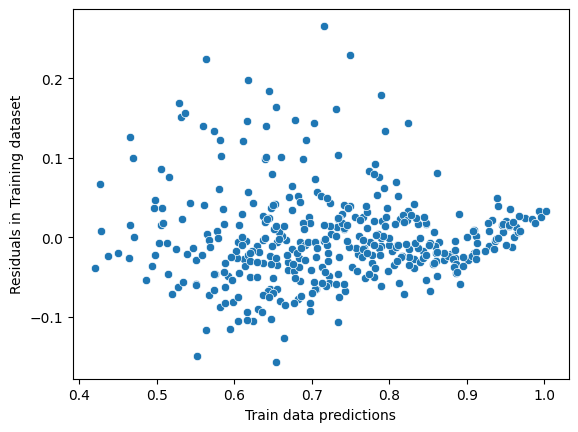

In [101]:
sns.scatterplot(x = ytrain_preds_lin.reshape(1,-1)[0], y = errors_train_lin['Chance of Admit'].tolist())
plt.xlabel('Train data predictions')
plt.ylabel('Residuals in Training dataset')
plt.show()

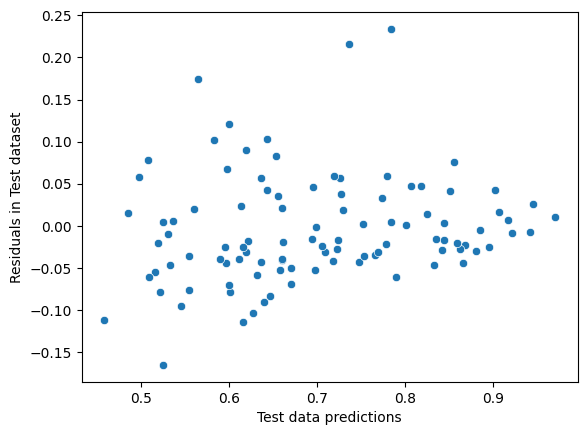

In [102]:
sns.scatterplot(x = ytest_preds_lin.reshape(1,-1)[0], y = errors_test_lin['Chance of Admit'].tolist())
plt.xlabel('Test data predictions')
plt.ylabel('Residuals in Test dataset')
plt.show()

Observations:
1. It seems that the data points exhibit a pattern that suggests heteroscedasticity. This means that the residuals do not have a constant variance across the range of an independent variable. The data points appear to fan out, indicating that the variance of the residuals is decreasing with the value of the predicted independent variable.

Testing the above hypothesis

In [103]:
#performing the GoldFeld Quandt test to check homoscedasticity
h0 = "Homoscedasticity is present"
ha = "Homoscedasticity is not present"
_, p_value, a = sm.stats.diagnostic.het_goldfeldquandt(errors_test_lin['Chance of Admit'].values, ytest_preds_lin)

print("p value: ",p_value)
if p_value < 0.05:
    print("Rejected Null Hypothesis.")
    print(ha)
else:
    print("Failed to reject Null Hypothesis.")
    print(h0)

p value:  0.011107912940704616
Rejected Null Hypothesis.
Homoscedasticity is not present


Observations:
1. Since the p-value is less than 0.05, hence the null hypothesis is rejected. We have sufficient evidence to say that homoscedasticity is not present in the residual and predictions.

##### 5. Normality of residuals

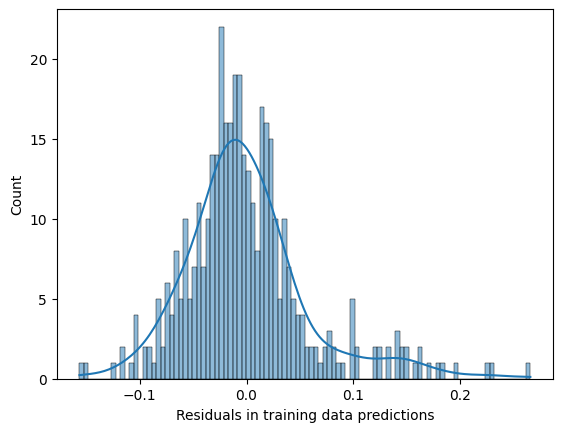

In [104]:
sns.histplot(data = errors_train_lin, x = 'Chance of Admit', bins = 100, kde = True)
plt.xlabel("Residuals in training data predictions")
plt.show()

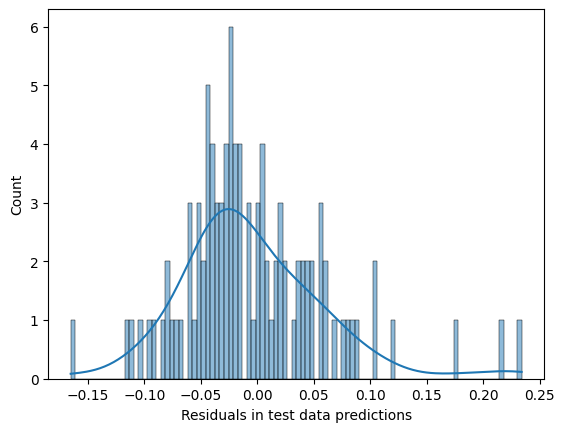

In [105]:
sns.histplot(data = errors_test_lin, x = 'Chance of Admit', bins = 100, kde = True)
plt.xlabel("Residuals in test data predictions")
plt.show()

Observations:
1. The plot shows a near normal distribution for the residuals.

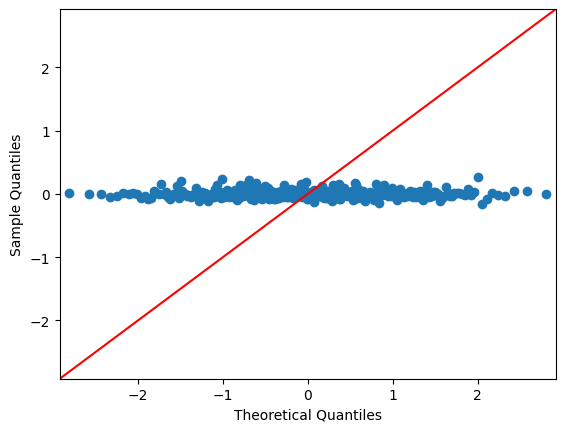

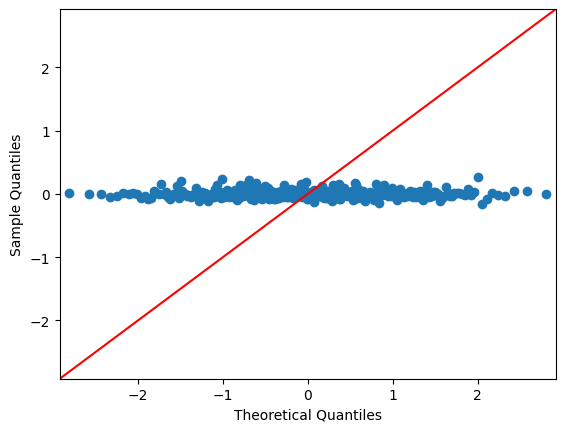

In [106]:
#comparing residual distribution with normal distribution
sm.qqplot(errors_train_lin, line = '45') 

Observations:
1. The QQplot suggests that the distribution of the residuals is not normal/

In [107]:
#Testing the normality of the residuals.
alpha = 0.05
# Shapiro-Wilk Test
h0 = "The population is normally distributed."
ha = "There is evidence that the data is not from a normally distributed population."
W, p = stats.shapiro(errors_train['Chance of Admit'].values)
print(f'Shapiro-Wilk Test: W={W}, p={p}')
if p < alpha:
    print("Null hypothesis is rejected.")
    print("Result: ", ha)
else:
    print("Failed to reject Null hypothesis.")
    print("Result: ", h0)
print("-"*50)

# Kolmogorov-Smirnov Test
h0 = "The two dataset values are from the same continuous distribution."
ha = "The two datasets are from different continuous distributions."
D, p = stats.kstest(errors_train['Chance of Admit'].values, 'norm')
print(f'Kolmogorov-Smirnov Test: D={D}, p={p}')
if p < alpha:
    print("Null hypothesis is rejected.")
    print("Result: ", ha)
else:
    print("Failed to reject Null hypothesis.")
    print("Result: ", h0)

Shapiro-Wilk Test: W=0.9712721109390259, p=4.313304486913694e-07
Null hypothesis is rejected.
Result:  There is evidence that the data is not from a normally distributed population.
--------------------------------------------------
Kolmogorov-Smirnov Test: D=0.42355170499899614, p=1.3304106108721884e-65
Null hypothesis is rejected.
Result:  The two datasets are from different continuous distributions.


Observations:
1. Both Shapiro Wilk test as well as the KS Test confirms that the residuals are not normally distributed.

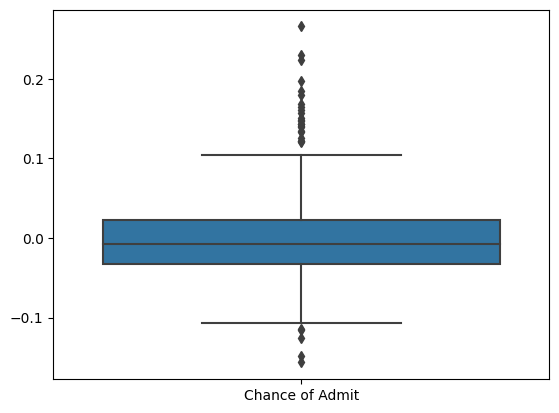

In [108]:
#checking if outliers could be causing the non-normal distribution in the residuals
sns.boxplot(data  = errors_train_lin)
plt.show()

Observations:
1. The boxplot shows a lot of outliers. This could be the reason for the non-normal distribution.

Observations:
1. The dataset does not satisty all the assumptions for linear regression. 
2. The dataset has multicollinearity.
3. The dataset does not satisfy the homoscedasticity and the normality of residuals assumptions.

#### Trying Lasso and Ridge models

##### Lasso

In [109]:
#using features selected from VIF analysis
X = data[features_to_use]
Y = data[['Chance of Admit']]

xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size = 0.2, random_state = 0)

sc = StandardScaler()
xtrain_sc = sc.fit_transform(xtrain)
xtest_sc = sc.transform(xtest)

lasso_reg = Lasso(alpha = 0.01)
lasso_reg.fit(xtrain_sc, ytrain)
r2_train = lasso_reg.score(xtrain_sc, ytrain)
r2_test = lasso_reg.score(xtest_sc, ytest)
print("Training data R2 score: ", r2_train)
print("Test data R2 score: ", r2_test)
adj_r2_train = 1 - (((1-r2_train)*(xtrain.shape[0]-1))/(xtrain.shape[0] - xtrain.shape[1] - 1))
adj_r2_test = 1 - (((1-r2_test)*(xtest.shape[0]-1))/(xtest.shape[0] - xtest.shape[1] - 1))
print("Training data adj R2 score: ", adj_r2_train)
print("Test data adj R2 score: ", adj_r2_test)
print()

for feature, coef in zip(features_to_use, lasso_reg.coef_):
    print(f"The coefficient for feature {feature} is {coef}.")
print(f"The intercept is {lasso_reg.intercept_[0]}")

Training data R2 score:  0.8231129958802266
Test data R2 score:  0.7740818699822181
Training data adj R2 score:  0.8190309880928472
Test data adj R2 score:  0.7514900569804399

The coefficient for feature University Rating is 0.003068837192570375.
The coefficient for feature SOP is 0.0.
The coefficient for feature LOR is 0.012076275505450642.
The coefficient for feature CGPA is 0.07151352873199496.
The coefficient for feature Research is 0.006246110125263582.
The coefficient for feature SOP_LOR is 0.003174825008842778.
The coefficient for feature GRE_Score_cb is 0.023267769941622603.
The coefficient for feature TOELF_Score_cb is 0.012882283469710152.
The coefficient for feature CGPA_GRE_cb is 0.0.
The intercept is 0.72655


In [110]:
X = data[features_to_use]
Y = data[['Chance of Admit']]

xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size = 0.2, random_state = 0)

sc = StandardScaler()
xtrain_sc = sc.fit_transform(xtrain)
xtest_sc = sc.transform(xtest)

ridge_reg = Ridge(alpha = 0.01)
ridge_reg.fit(xtrain_sc, ytrain)
r2_train = ridge_reg.score(xtrain_sc, ytrain)
r2_test = ridge_reg.score(xtest_sc, ytest)
print("Training data R2 score: ", r2_train)
print("Test data R2 score: ", r2_test)
adj_r2_train = 1 - (((1-r2_train)*(xtrain.shape[0]-1))/(xtrain.shape[0] - xtrain.shape[1] - 1))
adj_r2_test = 1 - (((1-r2_test)*(xtest.shape[0]-1))/(xtest.shape[0] - xtest.shape[1] - 1))
print("Training data adj R2 score: ", adj_r2_train)
print("Test data adj R2 score: ", adj_r2_test)
print()

for feature, coef in zip(features_to_use, ridge_reg.coef_[0]):
    print(f"The coefficient for feature {feature} is {coef}.")
print(f"The intercept is {ridge_reg.intercept_[0]}")

Training data R2 score:  0.8331884265636215
Test data R2 score:  0.7628830557070199
Training data adj R2 score:  0.8293389287150896
Test data adj R2 score:  0.7391713612777218

The coefficient for feature University Rating is 0.006680038626536926.
The coefficient for feature SOP is -0.005706683060520828.
The coefficient for feature LOR is 0.013653584903324157.
The coefficient for feature CGPA is 0.10373914197655934.
The coefficient for feature Research is 0.012058222063883163.
The coefficient for feature SOP_LOR is 0.010463514511058982.
The coefficient for feature GRE_Score_cb is 0.0425910395280338.
The coefficient for feature TOELF_Score_cb is 0.018539348329256654.
The coefficient for feature CGPA_GRE_cb is -0.05217656710550938.
The intercept is 0.72655


Observations:
1. Incase of Lasso, using the features selected via VIF analysis:
    - Training data adj R2 score:  0.8190309880928472
    - Test data adj R2 score:  0.7514900569804399
    - The coefficient for feature University Rating is 0.003068837192570375.
    - The coefficient for feature SOP is 0.0.
    - The coefficient for feature LOR is 0.012076275505450642.
    - The coefficient for feature CGPA is 0.07151352873199496.
    - The coefficient for feature Research is 0.006246110125263582.
    - The coefficient for feature SOP_LOR is 0.003174825008842778.
    - The coefficient for feature GRE_Score_cb is 0.023267769941622603.
    - The coefficient for feature TOELF_Score_cb is 0.012882283469710152.
    - The coefficient for feature CGPA_GRE_cb is 0.0.
    - The intercept is 0.72655
2. Incase of Ridge, using the features selected via VIF analysis:
    -  Training data adj R2 score:  0.8293389287150896
    - Test data adj R2 score:  0.7391713612777218
    - The coefficient for feature University Rating is 0.006680038626536926.
    - The coefficient for feature SOP is -0.005706683060520828.
    - The coefficient for feature LOR is 0.013653584903324157.
    - The coefficient for feature CGPA is 0.10373914197655934.
    - The coefficient for feature Research is 0.012058222063883163.
    - The coefficient for feature SOP_LOR is 0.010463514511058982.
    - The coefficient for feature GRE_Score_cb is 0.0425910395280338.
    - The coefficient for feature TOELF_Score_cb is 0.018539348329256654.
    - The coefficient for feature CGPA_GRE_cb is -0.05217656710550938.
    - The intercept is 0.72655

##### Hyperparameter tuning Lasso

In [112]:
#Finding the best alpha
X = data.drop(['Serial No','Chance of Admit'],axis=1)
Y = data[['Chance of Admit']]

xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size = 0.2, random_state = 0)

sc = StandardScaler()
xtrain_sc = sc.fit_transform(xtrain)
xtest_sc = sc.transform(xtest)

hyper_alpha = [1, 1/10, 1/10**2, 1/10**3, 1/10**4, 1/10**5, 1/10**6]
test_R2 = []

#performing hyperparameter tuning
for alp in hyper_alpha:
    lasso_reg = Lasso(alpha = alp)
    lasso_reg.fit(xtrain_sc, ytrain)
    r2_train = lasso_reg.score(xtrain_sc, ytrain)
    r2_test = lasso_reg.score(xtest_sc, ytest)
    
    adj_r2_train = 1 - (((1-r2_train)*(xtrain.shape[0]-1))/(xtrain.shape[0] - xtrain.shape[1] - 1))
    adj_r2_test = 1 - (((1-r2_test)*(xtest.shape[0]-1))/(xtest.shape[0] - xtest.shape[1] - 1))
    test_R2.append(adj_r2_test)
    
print(test_R2)
print(f"The best alpha is {hyper_alpha[np.argmax(test_R2)]} with the maximum test Adjusted R2 score is: {np.max(test_R2)}")

[-0.3112655106384623, 0.09777609209312621, 0.7124636863963989, 0.7055051045266203, 0.7012636483814442, 0.7006196272252465, 0.7004717092481472]
The best alpha is 0.01 with the maximum test Adjusted R2 score is: 0.7124636863963989


Observations:
1. The best alpha is 0.01 with the maximum test Adjusted R2 score is: 0.71.

### Feature selection using Lasso

In [111]:
from sklearn.linear_model import ElasticNet

In [112]:
def plot_r2scores(line1, line2, best_x, line1_label = 'Train', line2_label = 'Test'):
    """
    This function uses the seaborn and matplotlib libraries to create line plots between the train and test errors. 
    The function draws a vertical line on the best value on x-axis that gives the best train and test adjusted r2 scores
    Input:
        line1: the train adjusted r2 scores as a list
        line2: the test adjusted r2 scores as a list
        best_x: the value on x-axis at which a vertical line to be drawn
        line1_label: label for the line1
        line2_label: label for the line2
    """
    plt.figure(figsize = (20,5))
    sns.lineplot(line1, label = line1_label)
    sns.lineplot(line2, label = line2_label)
    
    #draws the vertical line on x-axis
    plt.axvline(x= best_x, color='k', linestyle='--')
    plt.xticks(range(1,len(hyper_parameters)))
    plt.show()

In [113]:
#creating functions for Metrics
def mae(y_train, y_train_preds, y_test, y_test_preds):
    """
    This function calculated the Mean Absolute Error metric.
    input:
        y_train: the actual target values in train data
        y_train_preds: the predictions from the train data
        y_test: the actual target values in test data
        y_test_preds: the predictions from the test data
    Output:
        returns a tuple of train and test MAE values
    """
    #calculating the absolute residuals
    train_errors = abs(y_train - y_train_preds)
    test_errors = abs(y_test - y_test_preds)
    #calculating the mean
    train_mae = np.mean(train_errors)
    test_mae = np.mean(test_errors)
    return (train_mae,test_mae)

def mse(y_train, y_train_preds, y_test, y_test_preds):
     """
    This function calculated the Mean Squared Error metric.
    input:
        y_train: the actual target values in train data
        y_train_preds: the predictions from the train data
        y_test: the actual target values in test data
        y_test_preds: the predictions from the test data
    Output:
        returns a tuple of train and test MSE values
    """
    #calculating the squared residuals
    train_errors = (y_train - y_train_preds)**2
    test_errors = (y_test - y_test_preds)**2
    #calculating the mean
    train_mse = np.mean(train_errors)
    test_mse = np.mean(test_errors)
    return (train_mse,test_mse)

def rmse(y_train, y_train_preds, y_test, y_test_preds):
    """
    This function calculated the Root Mean Squared Error metric.
    input:
        y_train: the actual target values in train data
        y_train_preds: the predictions from the train data
        y_test: the actual target values in test data
        y_test_preds: the predictions from the test data
    Output:
        returns a tuple of train and test RMSE values
    """
    #calculating the squared residuals
    train_errors = (y_train - y_train_preds)**2
    test_errors = (y_test - y_test_preds)**2
    #calculating the mean
    train_mse = np.mean(train_errors)
    test_mse = np.mean(test_errors)
    #taking the roots
    train_mse = train_mse**0.5
    test_mse = test_mse**0.5
    return train_mse, test_mse

In [116]:
#Modelling on all features (original + engineered) with Lasso
X = data.drop(['Serial No','Chance of Admit'],axis=1)
Y = data[['Chance of Admit']]

xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size = 0.2, random_state = 0)

sc = StandardScaler()
xtrain_sc = sc.fit_transform(xtrain)
xtest_sc = sc.transform(xtest)

#The best alpha is 0.01 with the maximum test Adjusted R2 score is: 0.71.
lasso_reg = Lasso(alpha = 0.01)
lasso_reg.fit(xtrain_sc, ytrain)
r2_train = lasso_reg.score(xtrain_sc, ytrain)
r2_test = lasso_reg.score(xtest_sc, ytest)
print("Training data R2 score: ", r2_train)
print("Test data R2 score: ", r2_test)
adj_r2_train = 1 - (((1-r2_train)*(xtrain.shape[0]-1))/(xtrain.shape[0] - xtrain.shape[1] - 1))
adj_r2_test = 1 - (((1-r2_test)*(xtest.shape[0]-1))/(xtest.shape[0] - xtest.shape[1] - 1))
print("Training data adj R2 score: ", adj_r2_train)
print("Test data adj R2 score: ", adj_r2_test)
print(f"Coefficients: {lasso_reg.coef_}")
print(f"Coefficients: {lasso_reg.intercept_}")
lasso_features = data.drop(['Serial No','Chance of Admit'],axis=1).columns[np.where(lasso_reg.coef_)].tolist()
print("The features selected are:")
print(lasso_features)

Training data R2 score:  0.8223393759222842
Test data R2 score:  0.7734562377668598
Training data adj R2 score:  0.8124693412513
Test data adj R2 score:  0.7124636863963989
Coefficients: [0.         0.         0.00257633 0.         0.01287992 0.0022802
 0.00577688 0.         0.0718405  0.03043533 0.00240013 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
Coefficients: [0.72655]
The features selected are:
['University Rating', 'LOR', 'CGPA', 'Research', 'CGPA_GRE', 'CGPA_TOEFL', 'SOP_LOR']


Observations:
1. Weights assigned to the selected features in descending order are:
    - CGPA_GRE : 0.0718405
    - CGPA_TOEFL : 0.03043533 
    - LOR : 0.01287992 
    - Research : 0.00577688 
    - University Rating : 0.00257633 
    - SOP_LOR : 0.00240013 
    - CGPA : 0.0022802

In [117]:
#Modelling on features selected by Lasso with Lasso algorithm
X = data[lasso_features]
Y = data[['Chance of Admit']]

xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size = 0.2, random_state = 0)

sc = StandardScaler()
xtrain_sc = sc.fit_transform(xtrain)
xtest_sc = sc.transform(xtest)

lin_reg = LinearRegression()
lin_reg.fit(xtrain_sc, ytrain)
r2_train = lin_reg.score(xtrain_sc, ytrain)
r2_test = lin_reg.score(xtest_sc, ytest)
print("Training data R2 score: ", r2_train)
print("Test data R2 score: ", r2_test)
adj_r2_train = 1 - (((1-r2_train)*(xtrain.shape[0]-1))/(xtrain.shape[0] - xtrain.shape[1] - 1))
adj_r2_test = 1 - (((1-r2_test)*(xtest.shape[0]-1))/(xtest.shape[0] - xtest.shape[1] - 1))
print("Training data adj R2 score: ", adj_r2_train)
print("Test data adj R2 score: ", adj_r2_test)
ytrain_preds = lin_reg.predict(xtrain_sc)
ytest_preds = lin_reg.predict(xtest_sc)
errors_train = ytrain_preds - ytrain
errors_test = ytest_preds - ytest

Training data R2 score:  0.8303269039245228
Test data R2 score:  0.7682187337440242
Training data adj R2 score:  0.8272970272088893
Test data adj R2 score:  0.7505832026158521


Observations:
1. With the best alpha = 0.01 found by hyperparameter tuning, the features selected are ['University Rating', 'LOR', 'CGPA', 'Research', 'CGPA_GRE', 'CGPA_TOEFL', 'SOP_LOR'].
2. The adjusted R Square score for training data  is 0.8272970272088893 and test data is 0.7505832026158521.

### Hyperparameter tuning for ElasticNet

In [118]:
#finding the best hyperparameters using all the features (orid + engineered) for Elastic Net
X = data.drop(['Serial No','Chance of Admit'],axis=1)
Y = data[['Chance of Admit']]

xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size = 0.2, random_state = 0)

sc = StandardScaler()
xtrain_sc = sc.fit_transform(xtrain)
xtest_sc = sc.transform(xtest)

#defining hyperparameter values
alphas = [1,0.5, 1/10, 1/10**2, 1/10**3, 1/10**4]
l1_ratios = [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]
hyper_parameters = []
test_adj_r2 = []
train_adj_r2= []

#performing hyperparameter tuning
for alp in alphas:
    for l1 in l1_ratios:
        en_reg = ElasticNet(alpha = alp, l1_ratio = l1)
        en_reg.fit(xtrain_sc, ytrain)
        r2_train = en_reg.score(xtrain_sc, ytrain)
        r2_test = en_reg.score(xtest_sc, ytest)

        adj_r2_train = 1 - (((1-r2_train)*(xtrain.shape[0]-1))/(xtrain.shape[0] - xtrain.shape[1] - 1))
        adj_r2_test = 1 - (((1-r2_test)*(xtest.shape[0]-1))/(xtest.shape[0] - xtest.shape[1] - 1))
        test_adj_r2.append(adj_r2_test)
        train_adj_r2.append(adj_r2_train)
        hyper_parameters.append((alp,l1))
print("The best Train adjusted R2 score is: ",np.max(train_adj_r2))
print("The best Test adjusted R2 score is: ",np.max(test_adj_r2))
print(f"The best hyperparameters are : alpha = {hyper_parameters[np.argmax(test_adj_r2)][0]} and l1_ratio = {hyper_parameters[np.argmax(test_adj_r2)][1]}")

The best Train adjusted R2 score is:  0.8239366451262842
The best Test adjusted R2 score is:  0.7133511670029116
The best hyperparameters are : alpha = 0.1 and l1_ratio = 0.1


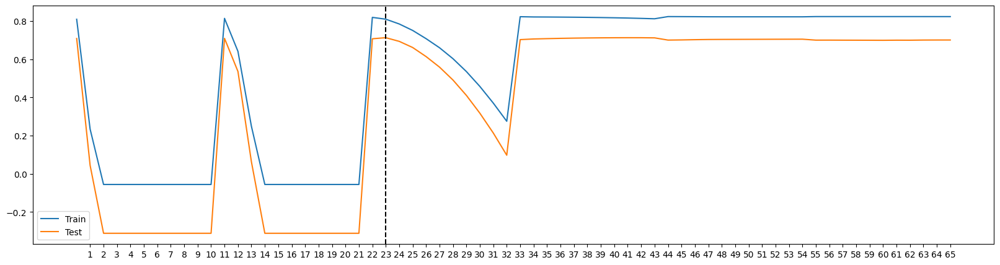

In [119]:
#checking train and test adjusted R2 score
plot_r2scores(train_adj_r2, test_adj_r2, np.argmax(test_adj_r2))

Observations:
1. Using all the features (original + engineered), the best hyperparameters identified for ElasticNet model are : alpha = 0.1 and l1_ratio = 0.1. 
2. The best Train adjusted R2 score is:  0.8239366451262842.
3. The best Test adjusted R2 score is:  0.7133511670029116.

In [121]:
#Hyperparameter tuning ElasticNet using features selected from Lasso
X = data[lasso_features]
Y = data[['Chance of Admit']]

xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size = 0.2, random_state = 0)

sc = StandardScaler()
xtrain_sc = sc.fit_transform(xtrain)
xtest_sc = sc.transform(xtest)

#definging hyperparameters
alphas = [1,0.5, 1/10, 1/10**2, 1/10**3, 1/10**4]
l1_ratios = [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]

hyper_parameters = []
train_adj_r2_1 = []
test_adj_r2_1 = []

#performing hyperparameter tuning
for alp in alphas:
    for l1 in l1_ratios:
        en_reg1 = ElasticNet(alpha = alp, l1_ratio = l1)
        en_reg1.fit(xtrain_sc, ytrain)
        r2_train = en_reg1.score(xtrain_sc, ytrain)
        r2_test = en_reg1.score(xtest_sc, ytest)

        adj_r2_train1 = 1 - (((1-r2_train)*(xtrain.shape[0]-1))/(xtrain.shape[0] - xtrain.shape[1] - 1))
        train_adj_r2_1.append(adj_r2_train1)
        adj_r2_test1 = 1 - (((1-r2_test)*(xtest.shape[0]-1))/(xtest.shape[0] - xtest.shape[1] - 1))
        test_adj_r2_1.append(adj_r2_test1)
        hyper_parameters.append((alp,l1))

print("The best Train adjusted R2 score is: ",np.max(train_adj_r2_1))
print("The best Test adjusted R2 score is: ",np.max(test_adj_r2_1))
print(f"The best hyperparameters are : alpha = {hyper_parameters[np.argmax(test_adj_r2_1)][0]} and l1_ratio = {hyper_parameters[np.argmax(test_adj_r2_1)][1]}")

The best Train adjusted R2 score is:  0.8272969766623464
The best Test adjusted R2 score is:  0.7590949296786944
The best hyperparameters are : alpha = 0.1 and l1_ratio = 0.1


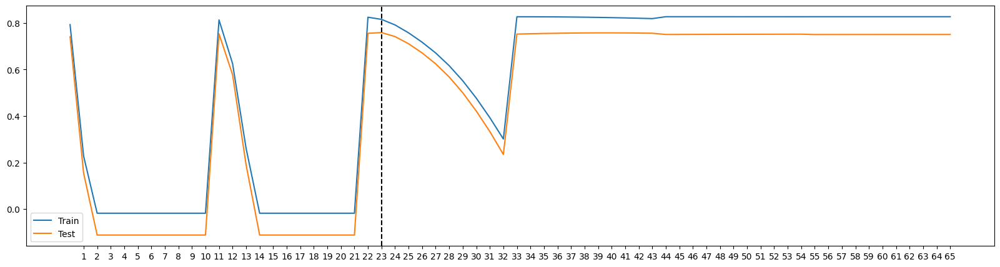

In [122]:
plot_r2scores(train_adj_r2_1, test_adj_r2_1, np.argmax(test_adj_r2_1))

Observations:
1. Using the features selected with Lasso model, the best hyperparameters for ElasticNet model are : alpha = 0.1 and l1_ratio = 0.1.
2. The best Train adjusted R2 score is:  0.8272969766623464.
3. The best Test adjusted R2 score is:  0.7590949296786944.

In [138]:
#Finding best hyperparameters for ElasticNet Using features identified with VIF analysis and Adjusrted R2 score comparison
X = data[features_to_use]
Y = data[['Chance of Admit']]

xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size = 0.2, random_state = 0)

sc = StandardScaler()
xtrain_sc = sc.fit_transform(xtrain)
xtest_sc = sc.transform(xtest)

alphas = [1,0.5, 1/10, 1/10**2, 1/10**3, 1/10**4]
l1_ratios = [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]

hyper_parameters = []
train_adj_r2_1 = []
test_adj_r2_1 = []

for alp in alphas:
    for l1 in l1_ratios:
        en_reg1 = ElasticNet(alpha = alp, l1_ratio = l1)
        en_reg1.fit(xtrain_sc, ytrain)
        r2_train = en_reg1.score(xtrain_sc, ytrain)
        r2_test = en_reg1.score(xtest_sc, ytest)

        adj_r2_train1 = 1 - (((1-r2_train)*(xtrain.shape[0]-1))/(xtrain.shape[0] - xtrain.shape[1] - 1))
        train_adj_r2_1.append(adj_r2_train1)
        adj_r2_test1 = 1 - (((1-r2_test)*(xtest.shape[0]-1))/(xtest.shape[0] - xtest.shape[1] - 1))
        test_adj_r2_1.append(adj_r2_test1)
        hyper_parameters.append((alp,l1))

print("The best Train adjusted R2 score is: ",np.max(train_adj_r2_1))
print("The best Test adjusted R2 score is: ",np.max(test_adj_r2_1))
print(f"The best hyperparameters are : alpha = {hyper_parameters[np.argmax(test_adj_r2_1)][0]} and l1_ratio = {hyper_parameters[np.argmax(test_adj_r2_1)][1]}")

The best Train adjusted R2 score is:  0.8293382904822699
The best Test adjusted R2 score is:  0.7517817272859387
The best hyperparameters are : alpha = 0.01 and l1_ratio = 0.8


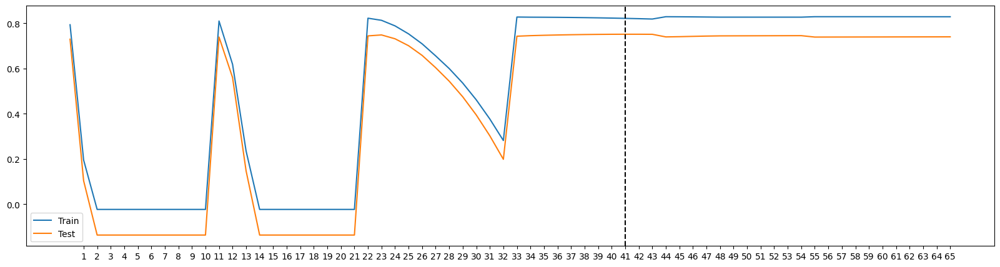

In [139]:
plot_r2scores(train_adj_r2_1, test_adj_r2_1, np.argmax(test_adj_r2_1))

Observations:
1. Using the features identified with VIF analysis and adjusted R2 score comparison, the best hyperparameters for ElasticNet model are : alpha = 0.01 and l1_ratio = 0.8.
2. The best Train adjusted R2 score is:  0.8293382904822699.
3. The best Test adjusted R2 score is:  0.7517817272859387.

In [141]:
#Finding best hyperparameters for ElasticNet Using the original features
original_features = ['GRE Score', 'TOEFL Score','University Rating','SOP','LOR','CGPA','Research']

X = data[original_features]
Y = data[['Chance of Admit']]

xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size = 0.2, random_state = 0)

sc = StandardScaler()
xtrain_sc = sc.fit_transform(xtrain)
xtest_sc = sc.transform(xtest)

alphas = [1,0.5, 1/10, 1/10**2, 1/10**3, 1/10**4]
l1_ratios = [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]

hyper_parameters = []
train_adj_r2_1 = []
test_adj_r2_1 = []

for alp in alphas:
    for l1 in l1_ratios:
        en_reg1 = ElasticNet(alpha = alp, l1_ratio = l1)
        en_reg1.fit(xtrain_sc, ytrain)
        r2_train = en_reg1.score(xtrain_sc, ytrain)
        r2_test = en_reg1.score(xtest_sc, ytest)

        adj_r2_train1 = 1 - (((1-r2_train)*(xtrain.shape[0]-1))/(xtrain.shape[0] - xtrain.shape[1] - 1))
        train_adj_r2_1.append(adj_r2_train1)
        adj_r2_test1 = 1 - (((1-r2_test)*(xtest.shape[0]-1))/(xtest.shape[0] - xtest.shape[1] - 1))
        test_adj_r2_1.append(adj_r2_test1)
        hyper_parameters.append((alp,l1))

print("The best Train adjusted R2 score is: ",np.max(train_adj_r2_1))
print("The best Test adjusted R2 score is: ",np.max(test_adj_r2_1))
print(f"The best hyperparameters are : alpha = {hyper_parameters[np.argmax(test_adj_r2_1)][0]} and l1_ratio = {hyper_parameters[np.argmax(test_adj_r2_1)][1]}")

The best Train adjusted R2 score is:  0.8290962080459361
The best Test adjusted R2 score is:  0.7560789694312418
The best hyperparameters are : alpha = 0.01 and l1_ratio = 0.8


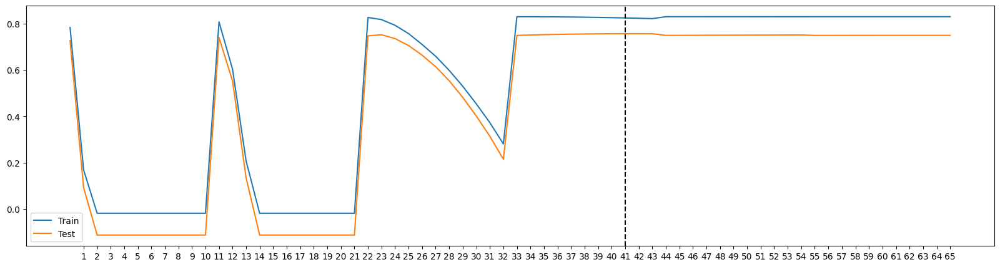

In [142]:
plot_r2scores(train_adj_r2_1, test_adj_r2_1, np.argmax(test_adj_r2_1))

Observations:
1. Using the original features, best hyperparameters for ElasticNet model are : alpha = 0.01 and l1_ratio = 0.8.
2. The best Train adjusted R2 score is:  0.8290962080459361.
3. The best Test adjusted R2 score is:  0.7560789694312418.

### Modeling ElasticNet model with best hyperparameters

##### Modeling using all features

In [119]:
#Using all the features (original + engineered), 
#the best hyperparameters identified for ElasticNet model are : alpha = 0.1 and l1_ratio = 0.1

X = data.drop(['Serial No','Chance of Admit'],axis=1)
Y = data[['Chance of Admit']]

xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size = 0.2, random_state = 0)

sc = StandardScaler()
xtrain_sc = sc.fit_transform(xtrain)
xtest_sc = sc.transform(xtest)

#creating ElasticNet model with best hyperparameters
en_reg_allfeatures = ElasticNet(alpha = 0.1, l1_ratio = 0.1)
en_reg_allfeatures.fit(xtrain_sc, ytrain)

#calculating all the evaluation metrics
#R2 score
r2_train = en_reg_allfeatures.score(xtrain_sc, ytrain)
r2_test = en_reg_allfeatures.score(xtest_sc, ytest)
print("Training data R2 score: ", r2_train)
print("Test data R2 score: ", r2_test)
print("-"*50)
#adjusted R2 score
adj_r2_train = 1 - (((1-r2_train)*(xtrain.shape[0]-1))/(xtrain.shape[0] - xtrain.shape[1] - 1))
adj_r2_test = 1 - (((1-r2_test)*(xtest.shape[0]-1))/(xtest.shape[0] - xtest.shape[1] - 1))
print("Training data adj R2 score: ", adj_r2_train)
print("Test data adj R2 score: ", adj_r2_test)
print("-"*50)

#calculating MAE, MSE and RMSE
ytrain_preds = en_reg_allfeatures.predict(xtrain_sc)
ytest_preds = en_reg_allfeatures.predict(xtest_sc)
maes = mae(ytrain['Chance of Admit'].values, ytrain_preds, ytest['Chance of Admit'].values, ytest_preds)
mses = mse(ytrain['Chance of Admit'].values, ytrain_preds, ytest['Chance of Admit'].values, ytest_preds)
rmses = rmse(ytrain['Chance of Admit'].values, ytrain_preds, ytest['Chance of Admit'].values, ytest_preds)

print("Train Mean Absolute error: ", round(maes[0],4))
print("Test Mean Absolute error: ", round(maes[1],4))
print("-"*50)
print("Train Mean Squared error: ", round(mses[0],4))
print("Test Mean Squared error: ", round(mses[1],4))
print("-"*50)
print("Train Root Mean Squared error: ", round(rmses[0],4))
print("Test Root Mean Squared error: ", round(rmses[1],4))

#Model interpretation
print("-"*50)
print("ElasticNet Regression model coefficients:")
for feature, coef in zip(data.drop(['Serial No','Chance of Admit'],axis=1).columns, en_reg_allfeatures.coef_):
    print(f"{feature}: {coef}")

Training data R2 score:  0.8202608893873344
Test data R2 score:  0.7741554649113849
--------------------------------------------------
Training data adj R2 score:  0.8102753832421863
Test data adj R2 score:  0.7133511670029116
--------------------------------------------------
Train Mean Absolute error:  0.043
Test Mean Absolute error:  0.0471
--------------------------------------------------
Train Mean Squared error:  0.0037
Test Mean Squared error:  0.0039
--------------------------------------------------
Train Root Mean Squared error:  0.0605
Test Root Mean Squared error:  0.0628
--------------------------------------------------
ElasticNet Regression model coefficients:
GRE Score: 0.004522164658691001
TOEFL Score: 0.0025459525142175195
University Rating: 0.003274549223453985
SOP: 0.0
LOR: 0.01042760259737035
CGPA: 0.01624628700706399
Research: 0.005853265138521222
average scores: 0.008701263511985639
CGPA_GRE: 0.014717848257396662
CGPA_TOEFL: 0.01290618418076472
SOP_LOR: 0.005441

##### Modelling for only the features selected via Lasso

In [123]:
#Using the features selected with Lasso model, 
#the best hyperparameters for ElasticNet model are : alpha = 0.1 and l1_ratio = 0.1.
    
X = data[lasso_features]
Y = data[['Chance of Admit']]

xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size = 0.2, random_state = 0)

sc = StandardScaler()
xtrain_sc = sc.fit_transform(xtrain)
xtest_sc = sc.transform(xtest)

#Creating ElasticNet with best hyperparameters
en_reg_lassofeatures = ElasticNet(alpha = 0.1, l1_ratio = 0.1)
en_reg_lassofeatures.fit(xtrain_sc, ytrain)

#calculating all the evaluation metrics
#R2 score
r2_train = en_reg_lassofeatures.score(xtrain_sc, ytrain)
r2_test = en_reg_lassofeatures.score(xtest_sc, ytest)
print("Training data R2 score: ", r2_train)
print("Test data R2 score: ", r2_test)
#adjusted R2 scores
adj_r2_train = 1 - (((1-r2_train)*(xtrain.shape[0]-1))/(xtrain.shape[0] - xtrain.shape[1] - 1))
adj_r2_test = 1 - (((1-r2_test)*(xtest.shape[0]-1))/(xtest.shape[0] - xtest.shape[1] - 1))
print("Training data adj R2 score: ", adj_r2_train)
print("Test data adj R2 score: ", adj_r2_test)
ytrain_preds = en_reg_lassofeatures.predict(xtrain_sc)
ytest_preds = en_reg_lassofeatures.predict(xtest_sc)

#calculating MAE, MSE and RMSE
maes = mae(ytrain['Chance of Admit'].values, ytrain_preds, ytest['Chance of Admit'].values, ytest_preds)
mses = mse(ytrain['Chance of Admit'].values, ytrain_preds, ytest['Chance of Admit'].values, ytest_preds)
rmses = rmse(ytrain['Chance of Admit'].values, ytrain_preds, ytest['Chance of Admit'].values, ytest_preds)

print("Train Mean Absolute error: ", round(maes[0],4))
print("Test Mean Absolute error: ", round(maes[1],4))
print("-"*50)
print("Train Mean Squared error: ", round(mses[0],4))
print("Test Mean Squared error: ", round(mses[1],4))
print("-"*50)
print("Train Root Mean Squared error: ", round(rmses[0],4))
print("Test Root Mean Squared error: ", round(rmses[1],4))

#Model interpretation
print("-"*50)
print("ElasticNet Regression model coefficients:")
for feature, coef in zip(lasso_features, en_reg_lassofeatures.coef_):
    print(f"{feature}: {coef}")

Training data R2 score:  0.8190249252171415
Test data R2 score:  0.7761286215195948
Training data adj R2 score:  0.8157932274531619
Test data adj R2 score:  0.7590949296786944
Train Mean Absolute error:  0.0433
Test Mean Absolute error:  0.0474
--------------------------------------------------
Train Mean Squared error:  0.0037
Test Mean Squared error:  0.0039
--------------------------------------------------
Train Root Mean Squared error:  0.0607
Test Root Mean Squared error:  0.0625
--------------------------------------------------
ElasticNet Regression model coefficients:
University Rating: 0.005240746957938272
LOR: 0.00955219292611821
CGPA: 0.0271355642838815
Research: 0.00827225075507507
CGPA_GRE: 0.038082942466023215
CGPA_TOEFL: 0.03205498550777732
SOP_LOR: 0.006847808259566391


##### Modelling for features selected via VIF Analysis and adj R2 score

In [124]:
#Using the features identified with VIF analysis and adjusted R2 score comparison, 
#the best hyperparameters for ElasticNet model are : alpha = 0.01 and l1_ratio = 0.8.
    
X = data[features_to_use]
Y = data[['Chance of Admit']]

xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size = 0.2, random_state = 0)

sc = StandardScaler()
xtrain_sc = sc.fit_transform(xtrain)
xtest_sc = sc.transform(xtest)

#Creating Elastic Net with best hyperparametr
en_reg_viffeatures = ElasticNet(alpha = 0.01, l1_ratio = 0.8)
en_reg_viffeatures.fit(xtrain_sc, ytrain)

#calculating all the evaluation metrics
#R2 score
r2_train = en_reg_viffeatures.score(xtrain_sc, ytrain)
r2_test = en_reg_viffeatures.score(xtest_sc, ytest)
print("Training data R2 score: ", r2_train)
print("Test data R2 score: ", r2_test)
#adjusted R2 score
adj_r2_train = 1 - (((1-r2_train)*(xtrain.shape[0]-1))/(xtrain.shape[0] - xtrain.shape[1] - 1))
adj_r2_test = 1 - (((1-r2_test)*(xtest.shape[0]-1))/(xtest.shape[0] - xtest.shape[1] - 1))
print("Training data adj R2 score: ", adj_r2_train)
print("Test data adj R2 score: ", adj_r2_test)
ytrain_preds = en_reg_viffeatures.predict(xtrain_sc)
ytest_preds = en_reg_viffeatures.predict(xtest_sc)

#MSE, MAE, RMSE
maes = mae(ytrain['Chance of Admit'].values, ytrain_preds, ytest['Chance of Admit'].values, ytest_preds)
mses = mse(ytrain['Chance of Admit'].values, ytrain_preds, ytest['Chance of Admit'].values, ytest_preds)
rmses = rmse(ytrain['Chance of Admit'].values, ytrain_preds, ytest['Chance of Admit'].values, ytest_preds)

print("Train Mean Absolute error: ", round(maes[0],4))
print("Test Mean Absolute error: ", round(maes[1],4))
print("-"*50)
print("Train Mean Squared error: ", round(mses[0],4))
print("Test Mean Squared error: ", round(mses[1],4))
print("-"*50)
print("Train Root Mean Squared error: ", round(rmses[0],4))
print("Test Root Mean Squared error: ", round(rmses[1],4))

#Model Interpretation
print("-"*50)
print("ElasticNet Regression model coefficients:")
for feature, coef in zip(features_to_use, en_reg_viffeatures.coef_):
    print(f"{feature}: {coef}")

Training data R2 score:  0.8260210726573038
Test data R2 score:  0.7743470248053989
Training data adj R2 score:  0.8220061743340108
Test data adj R2 score:  0.7517817272859387
Train Mean Absolute error:  0.0421
Test Mean Absolute error:  0.047
--------------------------------------------------
Train Mean Squared error:  0.0035
Test Mean Squared error:  0.0039
--------------------------------------------------
Train Root Mean Squared error:  0.0595
Test Root Mean Squared error:  0.0628
--------------------------------------------------
ElasticNet Regression model coefficients:
University Rating: 0.0038404733257884284
SOP: 0.0
LOR: 0.013388426751067014
CGPA: 0.07081202232486508
Research: 0.007421565996217937
SOP_LOR: 0.0027914243107319044
GRE_Score_cb: 0.02353653362200978
TOELF_Score_cb: 0.013731044158022947
CGPA_GRE_cb: 0.0


##### Modeling using the original features

In [125]:
#Using the original features, 
#best hyperparameters for ElasticNet model are : alpha = 0.01 and l1_ratio = 0.8.
    
X = data[original_features]
Y = data[['Chance of Admit']]

xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size = 0.2, random_state = 0)

sc = StandardScaler()
xtrain_sc = sc.fit_transform(xtrain)
xtest_sc = sc.transform(xtest)

#Creating Elastic Net model with best hyperparameters
en_reg_origfeatures = ElasticNet(alpha = 0.01, l1_ratio = 0.8)
en_reg_origfeatures.fit(xtrain_sc, ytrain)
r2_train = en_reg_origfeatures.score(xtrain_sc, ytrain)
r2_test = en_reg_origfeatures.score(xtest_sc, ytest)

#calculating all the evaluation metrics
#R2 score
print("Training data R2 score: ", r2_train)
print("Test data R2 score: ", r2_test)

#adjusted R2 scores
adj_r2_train = 1 - (((1-r2_train)*(xtrain.shape[0]-1))/(xtrain.shape[0] - xtrain.shape[1] - 1))
adj_r2_test = 1 - (((1-r2_test)*(xtest.shape[0]-1))/(xtest.shape[0] - xtest.shape[1] - 1))
print("Training data adj R2 score: ", adj_r2_train)
print("Test data adj R2 score: ", adj_r2_test)
ytrain_preds = en_reg_origfeatures.predict(xtrain_sc)
ytest_preds = en_reg_origfeatures.predict(xtest_sc)

#MSE, MAE, RMSE
maes = mae(ytrain['Chance of Admit'].values, ytrain_preds, ytest['Chance of Admit'].values, ytest_preds)
mses = mse(ytrain['Chance of Admit'].values, ytrain_preds, ytest['Chance of Admit'].values, ytest_preds)
rmses = rmse(ytrain['Chance of Admit'].values, ytrain_preds, ytest['Chance of Admit'].values, ytest_preds)

print("Train Mean Absolute error: ", round(maes[0],4))
print("Test Mean Absolute error: ", round(maes[1],4))
print("-"*50)
print("Train Mean Squared error: ", round(mses[0],4))
print("Test Mean Squared error: ", round(mses[1],4))
print("-"*50)
print("Train Root Mean Squared error: ", round(rmses[0],4))
print("Test Root Mean Squared error: ", round(rmses[1],4))

#Model Interpretation
print("-"*50)
print("ElasticNet Regression model coefficients:")
for feature, coef in zip(original_features, en_reg_origfeatures.coef_):
    print(f"{feature}: {coef}")

Training data R2 score:  0.8268922594538258
Test data R2 score:  0.7733259109866085
Training data adj R2 score:  0.8238010498012156
Test data adj R2 score:  0.7560789694312418
Train Mean Absolute error:  0.042
Test Mean Absolute error:  0.0469
--------------------------------------------------
Train Mean Squared error:  0.0035
Test Mean Squared error:  0.004
--------------------------------------------------
Train Root Mean Squared error:  0.0594
Test Root Mean Squared error:  0.0629
--------------------------------------------------
ElasticNet Regression model coefficients:
GRE Score: 0.023575829258225794
TOEFL Score: 0.014821636434250126
University Rating: 0.004290431371145048
SOP: 0.0
LOR: 0.015150749163173521
CGPA: 0.07066620584175924
Research: 0.007248446512482136


Observations:
1. The Evaluation metrics for ElasticNet model with all the features (original + featured) and best hyperparameters alpha = 0.1 and l1_ratio = 0.1 : Model name - en_reg_allfeatures
    - Training data R2 score: 0.8202608893873344. Test data R2 score: 0.7741554649113849.
    - Training data adj R2 score: 0.8102753832421863. Test data adj R2 score: 0.7133511670029116
    - Train Mean Absolute error: 0.043. Test Mean Absolute error: 0.0471
    - Train Mean Squared error: 0.0037. Test Mean Squared error: 0.0039
    - Train Root Mean Squared error: 0.0605. Test Root Mean Squared error: 0.0628
2. The Evaluation metrics for ElasticNet model with the features selected using Lasso model and best hyperparameters alpha = 0.1 and l1_ratio = 0.1. Model name - en_reg_lassofeatures
    - Training data R2 score:  0.8190249252171415. Test data R2 score:  0.7761286215195948
    - Training data adj R2 score:  0.8157932274531619. Test data adj R2 score:  0.7590949296786944
    - Train Mean Absolute error:  0.0433. Test Mean Absolute error:  0.0474
    - Train Mean Squared error:  0.0037. Test Mean Squared error:  0.0039
    - Train Root Mean Squared error:  0.0607. Test Root Mean Squared error:  0.0625
3. The Evaluation metrics for ElasticNet model with the features selected using VIF analysis and adjusted R2 score with best hyperparameters for ElasticNet model are : alpha = 0.01 and l1_ratio = 0.8: Model name - en_reg_viffeatures
    - Training data R2 score:  0.8260210726573038. Test data R2 score:  0.7743470248053989
    - Training data adj R2 score:  0.8220061743340108. Test data adj R2 score:  0.7517817272859387
    - Train Mean Absolute error:  0.0421. Test Mean Absolute error:  0.047.
    - Train Mean Squared error:  0.0035. Test Mean Squared error:  0.0039.
    - Train Root Mean Squared error:  0.0595. Test Root Mean Squared error:  0.0628.
4. The Evaluation metrics for ElasticNet model with the original features with best hyperparameters for ElasticNet model are : alpha = 0.01 and l1_ratio = 0.8: Model name - en_reg_origfeatures
    - Training data R2 score:  0.8268922594538258. Test data R2 score:  0.7733259109866085
    - Training data adj R2 score:  0.8238010498012156. Test data adj R2 score:  0.7560789694312418
    - Train Mean Absolute error:  0.042. Test Mean Absolute error:  0.0469
    - Train Mean Squared error:  0.0035. Test Mean Squared error:  0.004
    - Train Root Mean Squared error:  0.0594. Test Root Mean Squared error:  0.0629
5. From the error metrics, there is not much difference between the four models. However, if we notice the test adjusted R2 score, we can see that the ElasticNet model trained on Features selected using Lasso model is generalizing slightly better with an adjusted R2 score of 0.7590949296786944 for test data than the other models.

# Polynomial Regression

## Hyperparameter tuning ElasticNet + Polynomial Regression

In [509]:
# Using the Original features
X = data[['GRE Score', 'TOEFL Score', 'University Rating', 'SOP','LOR', 'CGPA', 'Research']]
y = data['Chance of Admit']

# Split the dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Define the cross-validation method
cv = KFold(n_splits=10, random_state=1, shuffle=True)

# Define the range of the hyper
degrees = np.arange(1, 6)
alphas = [1, 1/10, 1/100, 1/1000]
li_ratios = [0,0.1,0.2,0.3]

# Initialize a list to store the average cross-validation scores for each degree
avg_scores = []
combo = []

# Loop over each hyperparameters
for degree in degrees:
    for alp in alphas:
        for l1 in l1_ratios:
            # Create a pipeline that scales the data, creates polynomial features, and then fits a linear regression model
            pipeline = make_pipeline(StandardScaler(), PolynomialFeatures(degree=degree), ElasticNet(alpha = alp, l1_ratio = l1))

            # Calculate the cross-validation score
            scores = cross_val_score(pipeline, X_train, y_train, cv=cv, scoring='neg_mean_squared_error')

            # Calculate the mean of the scores
            mean_score = np.mean(scores)

            # Append the mean score to the list of average scores
            avg_scores.append(mean_score)
            combo.append((degree, alp,l1))

# Find the degree that gave the highest average score
best_hyperparam = combo[np.argmax(avg_scores)]
best_score = np.max(avg_scores)

# Print the best hyperparameter
print(f'Best hyperparamer combo: {best_hyperparam}')
print(f"Best average score: {best_score}")

Best hyperparamer combo: (2, 0.01, 0.2)
Best average score: -0.0034616537168779176


In [510]:
#Using the features optained from feature selection in Lasso model
lasso_features = ['University Rating', 'LOR', 'CGPA', 'Research', 'CGPA_GRE', 'CGPA_TOEFL', 'SOP_LOR']

# Assume you have a DataFrame `df` with your data
X = data[lasso_features]
y = data['Chance of Admit']

# Split the dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Define the cross-validation method
cv = KFold(n_splits=10, random_state=1, shuffle=True)

# Define the range of degrees to test
degrees = np.arange(1, 6)
alphas = [1, 1/10, 1/100, 1/1000]
li_ratios = [0,0.1,0.2,0.3]

# Initialize a list to store the average cross-validation scores for each degree
avg_scores = []
combo = []

# Loop over each hyperparameters
for degree in degrees:
    for alp in alphas:
        for l1 in l1_ratios:
            # Create a pipeline that scales the data, creates polynomial features, and then fits a linear regression model
            pipeline = make_pipeline(StandardScaler(), PolynomialFeatures(degree=degree), ElasticNet(alpha = alp, l1_ratio = l1))

            # Calculate the cross-validation score
            scores = cross_val_score(pipeline, X_train, y_train, cv=cv, scoring='neg_mean_squared_error')

            # Calculate the mean of the scores
            mean_score = np.mean(scores)

            # Append the mean score to the list of average scores
            avg_scores.append(mean_score)
            combo.append((degree, alp,l1))

# Find the degree that gave the highest average score
best_hyperparam = combo[np.argmax(avg_scores)]
best_score = np.max(avg_scores)


# Print the best hyperparameters
print(f'Best degree: {best_hyperparam}')
print(f"Best average score: {best_score}")

Best degree: (2, 0.001, 1)
Best average score: -0.0034730198269080385


In [511]:
#Using the Features chosen after VIF analysis and Adjusted R2 comparison is/are:
vif_analysis_features = ['University Rating', 'SOP', 'LOR', 'CGPA', 'Research', 'SOP_LOR', 'GRE_Score_cb', 'TOELF_Score_cb', 'CGPA_GRE_cb']


# Assume you have a DataFrame `df` with your data
X = data[vif_analysis_features]
y = data['Chance of Admit']

# Split the dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Define the cross-validation method
cv = KFold(n_splits=10, random_state=1, shuffle=True)

# Define the range of degrees to test
degrees = np.arange(1, 6)
alphas = [1, 1/10, 1/100, 1/1000]
li_ratios = [0,0.1,0.2,0.3]

# Initialize a list to store the average cross-validation scores for each degree
avg_scores = []
combo = []

# Loop over each hyperparameters
for degree in degrees:
    for alp in alphas:
        for l1 in l1_ratios:
            # Create a pipeline that scales the data, creates polynomial features, and then fits a linear regression model
            pipeline = make_pipeline(StandardScaler(), PolynomialFeatures(degree=degree), ElasticNet(alpha = alp, l1_ratio = l1))

            # Calculate the cross-validation score
            scores = cross_val_score(pipeline, X_train, y_train, cv=cv, scoring='neg_mean_squared_error')

            # Calculate the mean of the scores
            mean_score = np.mean(scores)

            # Append the mean score to the list of average scores
            avg_scores.append(mean_score)
            combo.append((degree, alp,l1))

# Find the degree that gave the highest average score
best_hyperparam = combo[np.argmax(avg_scores)]
best_score = np.max(avg_scores)

# Print the best hyperparameters
print(f'Best degree: {best_hyperparam}')
print(f"Best average score: {best_score}")

Best degree: (2, 0.01, 0.1)
Best average score: -0.003464541325961877


In [512]:
# Using all the features (Original + engineered)
X = data.drop(['Serial No', 'Chance of Admit'], axis = 1)
y = data['Chance of Admit']

# Split the dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Define the cross-validation method
cv = KFold(n_splits=10, random_state=1, shuffle=True)

# Define the range of degrees to test
degrees = np.arange(1, 6)
alphas = [1, 1/10, 1/100, 1/1000]
li_ratios = [0,0.1,0.2,0.3]

# Initialize a list to store the average cross-validation scores for each degree
avg_scores = []
combo = []

# Loop over each hypereparameters
for degree in degrees:
    for alp in alphas:
        for l1 in l1_ratios:
            # Create a pipeline that scales the data, creates polynomial features, and then fits a linear regression model
            pipeline = make_pipeline(StandardScaler(), PolynomialFeatures(degree=degree), ElasticNet(alpha = alp, l1_ratio = l1))

            # Calculate the cross-validation score
            scores = cross_val_score(pipeline, X_train, y_train, cv=cv, scoring='neg_mean_squared_error')

            # Calculate the mean of the scores
            mean_score = np.mean(scores)

            # Append the mean score to the list of average scores
            avg_scores.append(mean_score)
            combo.append((degree, alp,l1))

# Find the degree that gave the highest average score
best_hyperparam = combo[np.argmax(avg_scores)]
best_score = np.max(avg_scores)

# Print the best hypereparameters
print(f'Best degree: {best_hyperparam}')
print(f"Best average score: {best_score}")

Best degree: (2, 0.01, 0.2)
Best average score: -0.0034662350424904754


Observations:

Hyperparameter tuning results with Polynomial Regression - using Negative Mean Squared Error as the evaluation metric:

1. Using the original features:
    - Best hyperparamer combo: (degree of polynomial = 2, ElasticNet alpha = 0.01, ElasticNet l1_ratio = 0.2)
    - Best average score: -0.0034616537168779176
2. Using the features optained from feature selection in Lasso model:
    - Best hyperparamer combo: (degree of polynomial = 2, ElasticNet alpha = 0.001, ElasticNet l1_ratio = 1)
    - Best average score: -0.0034730198269080385
3. Using the Features chosen after VIF analysis and Adjusted R2 comparison:
    - Best hyperparamer combo: (degree of polynomial = 2, ElasticNet alpha = 0.01, ElasticNet l1_ratio = 0.1)
    - Best average score: -0.003464541325961877
4. Using all the features (Original + engineered):
    - Best hyperparamer combo: (degree of polynomial = 2, ElasticNet alpha = 0.01, ElasticNet l1_ratio = 0.2)
    - Best average score: -0.0034662350424904754

#### Modelling Polynomial Regression using the best hyperparameters identified

In [137]:
def polynomialreg_model_interpretation(X, model):
    """
    This function helps in creating feature names for the polynomial regression and interpret the model
    by getting the coefficients of each features.
    Input:
        X: Independent variables as pandas dataframe
        model: Model to be interpreted
    """
    # Manually creating feature names for degree=2
    feature_names = []
    for i in range(len(X.columns)):
        for j in range(i, len(X.columns)):
            if i == j:
                feature_names.append(X.columns[i] + '^2')
            else:
                feature_names.append(X.columns[i] + '*' + X.columns[j])

    print("Polynomial Regression with ElasticNet model coefficients:")
    print('-'*30)
    #getting the coefficients for each feature
    for feature, coef in zip(feature_names, model.coef_):
        if coef != 0:
            print(f"{feature}: {coef}")

In [138]:
#Using all features (original + engineered)
#Best hyperparamer combo: (degree of polynomial = 2, ElasticNet alpha = 0.01, ElasticNet l1_ratio = 0.2)
X = data.drop(['Serial No', 'Chance of Admit'], axis = 1)
y = data['Chance of Admit']

# Split the dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

#normalizing
sc = StandardScaler()
xtrain_sc = sc.fit_transform(X_train)
xtest_sc = sc.transform(X_test)

#creating polynomial features of degree 2
poly = PolynomialFeatures(degree = 2)
xtrain_poly = poly.fit_transform(xtrain_sc)
xtest_poly = poly.transform(xtest_sc)

#creating Elastic net model with best hyperparameters
en_reg_poly_allfeatuers = ElasticNet(alpha = 0.01, l1_ratio = 0.2)
en_reg_poly_allfeatuers.fit(xtrain_poly, ytrain)

ytrain_preds = en_reg_poly_allfeatuers.predict(xtrain_poly)
ytest_preds = en_reg_poly_allfeatuers.predict(xtest_poly)

#R2 scores
train_r2 = en_reg_poly_allfeatuers.score(xtrain_poly, ytrain)
test_r2 = en_reg_poly_allfeatuers.score(xtest_poly, ytest)

#adjusted R2 scores
train_adjr2 = 1 - (((1-train_r2)*(1-xtrain.shape[0]))/(1-xtrain.shape[0]-xtrain.shape[1]))
test_adjr2 = 1 - (((1-test_r2)*(1-xtest.shape[0]))/(1-xtest.shape[0]-xtest.shape[1]))

print("Evaluation Metrics:")
print("-"*20)
print("R2 score for training dataset: ", train_r2)
print("R2 score for test dataset: ", test_r2)
print("Adjusted R2 score for training dataset: ", train_adjr2)
print("Adjusted R2 score for training dataset: ", test_adjr2)
print("-"*50)

#MSE, MAE, RMSE
maes = mae(y_train, ytrain_preds, y_test, ytest_preds)
mses = mse(y_train, ytrain_preds, y_test, ytest_preds)
rmses = rmse(y_train, ytrain_preds, y_test, ytest_preds)

print("Train Mean Absolute error: ", round(maes[0],4))
print("Test Mean Absolute error: ", round(maes[1],4))
print("-"*50)
print("Train Mean Squared error: ", round(mses[0],4))
print("Test Mean Squared error: ", round(mses[1],4))
print("-"*50)
print("Train Root Mean Squared error: ", round(rmses[0],4))
print("Test Root Mean Squared error: ", round(rmses[1],4))
print("-"*50)
#Model interpretation
polynomialreg_model_interpretation(X, en_reg_poly_allfeatuers)

Evaluation Metrics:
--------------------
R2 score for training dataset:  0.8411189094535689
R2 score for test dataset:  0.7730333636506197
Adjusted R2 score for training dataset:  0.8438582386009212
Adjusted R2 score for training dataset:  0.788021726428409
--------------------------------------------------
Train Mean Absolute error:  0.0399
Test Mean Absolute error:  0.0465
--------------------------------------------------
Train Mean Squared error:  0.0032
Test Mean Squared error:  0.004
--------------------------------------------------
Train Root Mean Squared error:  0.0569
Test Root Mean Squared error:  0.063
--------------------------------------------------
Polynomial Regression with ElasticNet model coefficients:
------------------------------
GRE Score*TOEFL Score: 0.005741417098050679
GRE Score*University Rating: 0.004289606834300288
GRE Score*SOP: 0.007091802703054502
GRE Score*CGPA: 0.014855840733645312
GRE Score*Research: 0.020859715974687602
GRE Score*average scores: 0.01

#### vif_analysis_features

In [139]:
#Using the Features chosen after VIF analysis and Adjusted R2 comparison:
#Best hyperparamer combo: (degree of polynomial = 2, ElasticNet alpha = 0.01, ElasticNet l1_ratio = 0.1)
vif_analysis_features = features_to_use
X = data[vif_analysis_features]
y = data['Chance of Admit']

# Split the dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

#normalizing
sc = StandardScaler()
xtrain_sc = sc.fit_transform(X_train)
xtest_sc = sc.transform(X_test)

#creating polynomial features
poly = PolynomialFeatures(degree = 2)
xtrain_poly = poly.fit_transform(xtrain_sc)
xtest_poly = poly.transform(xtest_sc)

#creating Elastic net model with best hyperparameters
en_reg_poly_viffeatures = ElasticNet(alpha = 0.01, l1_ratio = 0.1)
en_reg_poly_viffeatures.fit(xtrain_poly, ytrain)

ytrain_preds = en_reg_poly_viffeatures.predict(xtrain_poly)
ytest_preds = en_reg_poly_viffeatures.predict(xtest_poly)

#R2 scors
train_r2 = en_reg_poly_viffeatures.score(xtrain_poly, ytrain)
test_r2 = en_reg_poly_viffeatures.score(xtest_poly, ytest)

#adjusted R2 scores
train_adjr2 = 1 - (((1-train_r2)*(1-xtrain.shape[0]))/(1-xtrain.shape[0]-xtrain.shape[1]))
test_adjr2 = 1 - (((1-test_r2)*(1-xtest.shape[0]))/(1-xtest.shape[0]-xtest.shape[1]))

print("Evaluation Metrics:")
print("-"*20)
print("R2 score for training dataset: ", train_r2)
print("R2 score for test dataset: ", test_r2)
print("Adjusted R2 score for training dataset: ", train_adjr2)
print("Adjusted R2 score for training dataset: ", test_adjr2)
print("-"*50)
#MSE MAE RMSE
maes = mae(y_train, ytrain_preds, y_test, ytest_preds)
mses = mse(y_train, ytrain_preds, y_test, ytest_preds)
rmses = rmse(y_train, ytrain_preds, y_test, ytest_preds)

print("Train Mean Absolute error: ", round(maes[0],4))
print("Test Mean Absolute error: ", round(maes[1],4))
print("-"*50)
print("Train Mean Squared error: ", round(mses[0],4))
print("Test Mean Squared error: ", round(mses[1],4))
print("-"*50)
print("Train Root Mean Squared error: ", round(rmses[0],4))
print("Test Root Mean Squared error: ", round(rmses[1],4))
print("-"*50)
#model interpretation
polynomialreg_model_interpretation(X, en_reg_poly_viffeatures)

Evaluation Metrics:
--------------------
R2 score for training dataset:  0.8442517877881006
R2 score for test dataset:  0.7720357293837667
Adjusted R2 score for training dataset:  0.8469371017917541
Adjusted R2 score for training dataset:  0.7870899736697444
--------------------------------------------------
Train Mean Absolute error:  0.0393
Test Mean Absolute error:  0.0464
--------------------------------------------------
Train Mean Squared error:  0.0032
Test Mean Squared error:  0.004
--------------------------------------------------
Train Root Mean Squared error:  0.0563
Test Root Mean Squared error:  0.0631
--------------------------------------------------
Polynomial Regression with ElasticNet model coefficients:
------------------------------
University Rating*SOP: 0.007601226113772048
University Rating*CGPA: 0.014716599180329746
University Rating*Research: 0.04714870954041446
University Rating*SOP_LOR: 0.012603430088594747
University Rating*GRE_Score_cb: 0.00420588904867148

##### lasso_features

In [140]:
#Using the features optained from feature selection in Lasso model:
#Best hyperparamer combo: (degree of polynomial = 2, ElasticNet alpha = 0.001, ElasticNet l1_ratio = 1)
    
X = data[lasso_features]
y = data['Chance of Admit']

# Split the dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

#normalizing
sc = StandardScaler()
xtrain_sc = sc.fit_transform(X_train)
xtest_sc = sc.transform(X_test)

#creating polynomial featires
poly = PolynomialFeatures(degree= 2 )
xtrain_poly = poly.fit_transform(xtrain_sc)
xtest_poly = poly.transform(xtest_sc)
#creating Elastic net model with best hyperparameters
en_reg_poly_lassofeatures = ElasticNet(alpha = 0.001, l1_ratio = 1)
en_reg_poly_lassofeatures.fit(xtrain_poly, ytrain)

ytrain_preds = en_reg_poly_lassofeatures.predict(xtrain_poly)
ytest_preds = en_reg_poly_lassofeatures.predict(xtest_poly)
#R2 scores
train_r2 = en_reg_poly_lassofeatures.score(xtrain_poly, ytrain)
test_r2 = en_reg_poly_lassofeatures.score(xtest_poly, ytest)
#adjusted R2 scores
train_adjr2 = 1 - (((1-train_r2)*(1-xtrain.shape[0]))/(1-xtrain.shape[0]-xtrain.shape[1]))
test_adjr2 = 1 - (((1-test_r2)*(1-xtest.shape[0]))/(1-xtest.shape[0]-xtest.shape[1]))

print("Evaluation Metrics:")
print("-"*20)
print("R2 score for training dataset: ", train_r2)
print("R2 score for test dataset: ", test_r2)
print("Adjusted R2 score for training dataset: ", train_adjr2)
print("Adjusted R2 score for training dataset: ", test_adjr2)
print("-"*50)
#MSE MAE RMSE
maes = mae(y_train, ytrain_preds, y_test, ytest_preds)
mses = mse(y_train, ytrain_preds, y_test, ytest_preds)
rmses = rmse(y_train, ytrain_preds, y_test, ytest_preds)

print("Train Mean Absolute error: ", round(maes[0],4))
print("Test Mean Absolute error: ", round(maes[1],4))
print("-"*50)
print("Train Mean Squared error: ", round(mses[0],4))
print("Test Mean Squared error: ", round(mses[1],4))
print("-"*50)
print("Train Root Mean Squared error: ", round(rmses[0],4))
print("Test Root Mean Squared error: ", round(rmses[1],4))
print("-"*50)
#model interpretation
polynomialreg_model_interpretation(X, en_reg_poly_lassofeatures)

Evaluation Metrics:
--------------------
R2 score for training dataset:  0.8402322113393939
R2 score for test dataset:  0.7717339748382116
Adjusted R2 score for training dataset:  0.8429868283852664
Adjusted R2 score for training dataset:  0.7868081463111599
--------------------------------------------------
Train Mean Absolute error:  0.0399
Test Mean Absolute error:  0.0467
--------------------------------------------------
Train Mean Squared error:  0.0033
Test Mean Squared error:  0.004
--------------------------------------------------
Train Root Mean Squared error:  0.057
Test Root Mean Squared error:  0.0631
--------------------------------------------------
Polynomial Regression with ElasticNet model coefficients:
------------------------------
University Rating*LOR: 0.00773715110120406
University Rating*CGPA: 0.015058502077854379
University Rating*CGPA_GRE: 0.012651939265340157
University Rating*CGPA_TOEFL: 0.06682689261621688
University Rating*SOP_LOR: 0.03817269285424134
LOR

#### Original Features

In [141]:
#Using the original features:
#Best hyperparamer combo: (degree of polynomial = 2, ElasticNet alpha = 0.01, ElasticNet l1_ratio = 0.2)

original_features = ['GRE Score', 'TOEFL Score', 'University Rating', 'SOP','LOR', 'CGPA', 'Research']
X = data[original_features]
y = data['Chance of Admit']

# Split the dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
#normalizing
sc = StandardScaler()
xtrain_sc = sc.fit_transform(X_train)
xtest_sc = sc.transform(X_test)
#creating polynomial features
poly = PolynomialFeatures(degree = 2)
xtrain_poly = poly.fit_transform(xtrain_sc)
xtest_poly = poly.transform(xtest_sc)
#creating Elastic net model with best hyperparameters
en_reg_poly_origfeatures = ElasticNet(alpha = 0.01, l1_ratio = 0.2)
en_reg_poly_origfeatures.fit(xtrain_poly, ytrain)

ytrain_preds = en_reg_poly_origfeatures.predict(xtrain_poly)
ytest_preds = en_reg_poly_origfeatures.predict(xtest_poly)
#R2 scores
train_r2 = en_reg_poly_origfeatures.score(xtrain_poly, ytrain)
test_r2 = en_reg_poly_origfeatures.score(xtest_poly, ytest)

train_adjr2 = 1 - (((1-train_r2)*(1-xtrain.shape[0]))/(1-xtrain.shape[0]-xtrain.shape[1]))
test_adjr2 = 1 - (((1-test_r2)*(1-xtest.shape[0]))/(1-xtest.shape[0]-xtest.shape[1]))

print("Evaluation Metrics:")
print("-"*20)
print("R2 score for training dataset: ", train_r2)
print("R2 score for test dataset: ", test_r2)
print("Adjusted R2 score for training dataset: ", train_adjr2)
print("Adjusted R2 score for training dataset: ", test_adjr2)
print("-"*50)
#MSE MAE RMSE
maes = mae(y_train, ytrain_preds, y_test, ytest_preds)
mses = mse(y_train, ytrain_preds, y_test, ytest_preds)
rmses = rmse(y_train, ytrain_preds, y_test, ytest_preds)

print("Train Mean Absolute error: ", round(maes[0],4))
print("Test Mean Absolute error: ", round(maes[1],4))
print("-"*50)
print("Train Mean Squared error: ", round(mses[0],4))
print("Test Mean Squared error: ", round(mses[1],4))
print("-"*50)
print("Train Root Mean Squared error: ", round(rmses[0],4))
print("Test Root Mean Squared error: ", round(rmses[1],4))
print("-"*50)
#model interpretation
polynomialreg_model_interpretation(X, en_reg_poly_origfeatures)

Evaluation Metrics:
--------------------
R2 score for training dataset:  0.8410818100866406
R2 score for test dataset:  0.7725670318808688
Adjusted R2 score for training dataset:  0.8438217788782503
Adjusted R2 score for training dataset:  0.7875861901528869
--------------------------------------------------
Train Mean Absolute error:  0.04
Test Mean Absolute error:  0.0465
--------------------------------------------------
Train Mean Squared error:  0.0032
Test Mean Squared error:  0.004
--------------------------------------------------
Train Root Mean Squared error:  0.0569
Test Root Mean Squared error:  0.063
--------------------------------------------------
Polynomial Regression with ElasticNet model coefficients:
------------------------------
GRE Score*TOEFL Score: 0.023641383612292254
GRE Score*University Rating: 0.01810249328587176
GRE Score*SOP: 0.00743016812121185
GRE Score*LOR: 0.0018761185033578257
GRE Score*CGPA: 0.016867370834687246
GRE Score*Research: 0.066432105859304

Observations:

The training as well as test performances have improved with Polynomial regression.

1. Using all features (original + engineered) for ElasticNet model with a best hyperparamer combo: (degree of polynomial = 2, ElasticNet alpha = 0.01, ElasticNet l1_ratio = 0.2): Model name - en_reg_poly_allfeatuers
    - R2 score for training dataset:  0.8411189094535689. R2 score for test dataset:  0.7730333636506197
    - Adjusted R2 score for training dataset:  0.8438582386009212. Adjusted R2 score for training dataset:  0.788021726428409
    - Train Mean Absolute error:  0.0399. Test Mean Absolute error:  0.0465
    - Train Mean Squared error:  0.0032. Test Mean Squared error:  0.004
    - Train Root Mean Squared error:  0.0569. Test Root Mean Squared error:  0.063
2. Using the Features chosen after VIF analysis and Adjusted R2 comparison for ElasticNet model with a best hyperparamer combo: (degree of polynomial = 2, ElasticNet alpha = 0.01, ElasticNet l1_ratio = 0.1): Model name - en_reg_poly_viffeatures
    - R2 score for training dataset:  0.8442517877881006. R2 score for test dataset:  0.7720357293837667
    - Adjusted R2 score for training dataset:  0.8469371017917541. Adjusted R2 score for training dataset:  0.7870899736697444
    - Train Mean Absolute error:  0.0393. Test Mean Absolute error:  0.0464
    - Train Mean Squared error:  0.0032. Test Mean Squared error:  0.004
    - Train Root Mean Squared error:  0.0563. Test Root Mean Squared error:  0.0631
3. Using the features optained from feature selection in Lasso model for ElasticNet model with a best hyperparamer combo: (degree of polynomial = 2, ElasticNet alpha = 0.001, ElasticNet l1_ratio = 1) :Model name - en_reg_poly_lassofeatures
    - R2 score for training dataset:  0.8402322113393939. R2 score for test dataset:  0.7717339748382116
    - Adjusted R2 score for training dataset:  0.8429868283852664. Adjusted R2 score for training dataset:  0.7868081463111599
    - Train Mean Absolute error:  0.0399. Test Mean Absolute error:  0.0467
    - Train Mean Squared error:  0.0033. Test Mean Squared error:  0.004
    - Train Root Mean Squared error:  0.057. Test Root Mean Squared error:  0.0631
4. Using the original features for ElasticNet model with a best hyperparamer combo: (degree of polynomial = 2, ElasticNet alpha = 0.01, ElasticNet l1_ratio = 0.2): Model name - en_reg_poly_origfeatures
    - R2 score for training dataset:  0.8410818100866406. R2 score for test dataset:  0.7725670318808688
    - Adjusted R2 score for training dataset:  0.8438217788782503. Adjusted R2 score for training dataset:  0.7875861901528869
    - Train Mean Absolute error:  0.04. Test Mean Absolute error:  0.0465
    - Train Mean Squared error:  0.0032. Test Mean Squared error:  0.004
    - Train Root Mean Squared error:  0.0569. Test Root Mean Squared error:  0.063
5. The evaluation metrics do not show significant difference between the 4 models. All the models are pretty much close to each other in terms of preformance. However, when we see the model interpretation of the models, the models that are built with original features and the model built with features selected via Lasso model are giving the same results with lesser model complexity.

# Actionable Insights

1.	The characteristics of successful students – Students with high chance of admission:
    - The students in the dataset have GRE Score > 290. There are students that have scored full marks (340) in GRE score. Students who have high GRE score tend to have high chance of admission. There is a significantly high positive correlation between GRE score and the chance of admission variables. When the GRE Score is > 315, the chances of admission are likely very high (>70%).
    - The students in the dataset have TOEFL Score > 92. There are students that have scored full marks (120) in TOEFL Score. Students who have high TOEFL Score tend to have high chance of admission. There is a significantly high positive correlation between the TOEFL Score and Chance of Admit variables. When the TOEFL Score is > 107, the chances of admission are very high (>70%).
    - The students in the dataset have CGPA >= 6.8. Students who have high CGPA tend to have high chance of admission. There is a significantly high positive correlation between the CGPA and Chance of Admit variables. When the CGPA is > 8.5, the chances of admission are very high (>70%).
    - At least 50% of the students/learners in the dataset are associated with universities that have rating less than or equal to 3. Most of the students are from universities that are rated moderately between 3 and 4. However, there are a few students that are from universities that are rated low and rated high. The chance of admission for students who are from universities that are rated above 3 are high (>70%).
    - Most of the SOPs of the students are moderately rated between 3, 3.5 and 4. Students with strength or rating more than 3.5 for their Statement of Purpose tend to have higher chance of admission (>70%).
    - Most of the LORs of the students are moderately rated between 3, 3.5 and 4. Students with strength or rating more than 3.5 for their Letter of Recommendation, tend to have higher chance of admission (>70%).
    - The students in the dataset are distributed almost equally between those who have research experience vs those who do not. The average chance of admission of students that have research experience is close to 75%. Research experience tend to influence the chance of admissions.
2. The highest influencers are the CGPA, GRE Scores and the TOEFL scores of the students, with respect to their correlation towards the chance of admission. The moderate influencers are 'University Ranking', 'SOP', 'LOR' and 'Research' (although the average chance of admission is high for students with research experience).
3. The GRE Score, TOEFL Score and CGPA have high correlation with each other. Students that performed well in one seems to have performed well in the others among these three variables.
4. Creating new features like the average score between GRE and TOEFL scores, interaction between SOP and LOR, and CGPA with GRE/TOEFL scores, seem to give more correlation with the Chance of admission than the correlation between the chance of admission to each of these features individually.
5. There is multicollinearity among the independent features. 
    - Using the Variance Inflation Factor analysis, it was identified that, among the original features, when we use only the TOEFL Score, University Rating and Research features, we are able to reduce multicollinearity. However, we still have multicollinearity in the dataset with just these 3 features also. The adjusted R2 score reduced significantly with only these 3 features.
    - Using the Variance Inflation Factor analysis, it was identified that, among the original features + engineered features (newly created features), when we use only the University Rating, Research and SOP_LOR (interaction between SOP and LOR. i.e., SOP x LOR) features, we are able to reduce multicollinearity. However, we still have multicollinearity in the dataset with just these 3 features also. The adjusted R2 score reduced significantly with only these 3 features.
    - Using the Variance Inflation Factor analysis and also keeping a check on the adjusted R2 score, it was identified that, among the original features + engineered features (newly created features), University Rating, SOP, LOR, CGPA, Research, SOP_LOR, GRE_Score_cb (cubic representation of GRE Score), TOEFL_Score_cb (cubic representation of TOEFL Score) and CGPA_GRE_cb (cubic representation of the interaction between CGPA and GRE Score, i.e., CGPA x GRE Score) reduced the multicollinearity in the dataset and still gave a decent adjusted R2 score. Please note that although the multicollinearity reduced, it is still a high value.
6. Some of the assumptions of linearity failed in the dataset. Like the multicollinearity, homoscedasticity and normality of residuals failed for the dataset.
7. Feature selection: Using the Lasso model to select the important features. The selected features are University Rating, LOR, CGPA, Research, CGPA_GRE (interaction feature between CGPA and GRE Score), CGPA_TOEFL (interaction features between CGPA and TOEFL score) and SOP_LOR (interaction feature between SOP and LOR). All these features were assigned positive weights but below 0.08. The CGPA_GRE has the highest weight, followed by CGPA_TOEFL and LOR. All the other features are assigned 0 as weights.

# Recommendations

1. Jamboree can help plan the learning paths of the students to concentrate on GRE and TOEFL exams. Scoring high marks will increase the students' chance of admission significantly. Jamboree can provide more study resources and provide classes to support.
2. Students need to focus on scoring high marks in the GRE/TOEFL tests as well as having a high CGPA will help in the admissions significantly.
3. Having a well written Statement of Purpose and a well written Letter of Recommendation may help students increase their chance of admission. Jamboree can plan on developing processes to review and validate the students' SOP and LORs. Jamboree can provide recommendations and help students to produce high quality SOPs and LORs
4. Studens can try to get some research experience. This will also increase their chance of admission. Jamboree can explore to tie up with some research institutions that can provide research experiences for their students. This may open doors for new services provided by Jamboree for its learners.

**Model recommendation:** 
1. Creating some new features are indeed helping to improve the model performance.
2. Since the dataset has multicollinearity, I have used ElasticNet algorithm to reduce the multicollinearity through Lasso and also regularize the model complexity.
    - ElasticNet models performed better than LinearRegression/ Lasso/Ridge models.
    - 4 models were built using ElasticNet algorithm :
    - Using all features (original + newly created). Model name - en_reg_allfeatures
    - Using features selected through VIF analysis. Model name - en_reg_viffeatures
    - Features selected through Lasso model. Model name - en_reg_lassofeatures 
    - Finally the original features. Model name - en_reg_origfeatures
    - The model complexity increased a lot when I used original features + newly created features. However, the model does not show any significant improvement in the performance. not justify the complexity.
    - The ElasticNet model en_reg_lassofeatures gave the best adjusted R2 score of test dataset and the difference between train and test adjusted R2 score was also the least. This model gave the least RMSE score among the 4 models. Training data adjusted R2 score: 0.824. Test data adjusted R2 score: 0.756.
    - Best hyperparameters for en_reg_lassofeatures are alpha = 0.01 and l1_ratio = 0.01.
    - Model interpretation for (en_reg_lassofeatures): feature weights -
        1. University Rating: 0.005240746957938272
        2. LOR: 0.00955219292611821
        3. CGPA: 0.0271355642838815
        4. Research: 0.00827225075507507
        5. CGPA_GRE: 0.038082942466023215
        6. CGPA_TOEFL: 0.03205498550777732
        7. SOP_LOR: 0.006847808259566391
3. I have also used Polynomial regression to see if that improves the model performance.
    - The Polynomial regression with ElasticNet model gave a better performance.
    - 4 models were built using Polynomial regression ElasticNet algorithm  :
    - Using all features (original + newly created). Model name - en_reg_poly_allfeatuers
    - Using features selected through VIF analysis. Model name - en_reg_poly_viffeatures
    - Features selected through Lasso model. Model name - en_reg_poly_lassofeatures
    - Finally the original features. Model name - en_reg_poly_origfeatures
    - The model complexity increased a lot when I used original features + newly created features. However, the model does not show any significant improvement in the performance. not justify the complexity.
    - The Polynomial regression ElasticNet model en_reg_poly_origfeatures gave the best adjusted R2 score of test dataset and the difference between train and test adjusted R2 score was also the least. This model gave the least RMSE score among the 4 models. Training data adjusted R2 score: 0.056. Test data adjusted R2 score: 0.063
    - The best hyperparameters are degree of polynomial = 2, ElasticNet alpha = 0.01, ElasticNet l1_ratio = 0.2). Model name - en_reg_poly_origfeatures
    - Model interpretation for en_reg_poly_origfeatures: feature weights-
        1. GRE Score*TOEFL Score: 0.023641383612292254
        2. GRE Score*University Rating: 0.01810249328587176
        3. GRE Score*SOP: 0.00743016812121185
        4. GRE Score*LOR: 0.0018761185033578257
        5. GRE Score*CGPA: 0.016867370834687246
        6. GRE Score*Research: 0.0664321058593043
        7. TOEFL Score^2: 0.011100967252258901
        8. University Rating^2: -0.002630346703763395
        9. LOR^2: 0.011925160268451647
        10. CGPA^2: 0.0021769302609390318
        11. CGPA*Research: -0.003748742783203655
        
**Recommendation for Model Implementation in Real World:**
1. User Interface: Develop a user-friendly interface where students can input their details and receive a prediction on their admission chances.
2. Continuous Monitoring and Updating: The model should be regularly updated with new data to ensure its relevance and accuracy. Also, monitor the model’s performance over time to detect any degradation/drift.
3. Ethical Considerations: Be transparent about how the model makes predictions and ensure it doesn’t discriminate against any group of students.

**Recommending Additional Data Sources:**
1. Demographic Data: Information such as the student’s home country, the medium of instruction in their previous education, and their intended major could also be relevant. However, it’s important to use this kind of information responsibly to avoid any bias in your model.
2. Historical Data: If we have access to data over multiple application cycles, this could help capture trends over time. For example, the admission rate for a particular university or major might be increasing or decreasing over time.

**Potential Business Benefits from Improving the Model:**
1. The models produced in the project were built with 500 records and 7 original features. Increasing the number of data and a few additional relevant features can improve the model.
2. The team can explore the use of some advanced ensemble models like bagging and boosting models may help improve the predictive performance.
3. This will lead to improved Success Rate: A more accurate model can help more students get admitted to top universities, enhancing Jamboree's reputation among the population.
4. Improved models may help in personalized guidance for the students: The model can help identify areas where a student can improve, allowing for personalized guidance.
5. Efficient Resource Allocation: By knowing what factors contribute most to admission, the institution can allocate resources more efficiently, like focusing more on certain preparatory classes.

